<a href="https://colab.research.google.com/github/fxfk/MSc_project/blob/main/Finnegan_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install peakutils
!pip install pyDOE2
import numpy as np
import peakutils
import matplotlib.pyplot as plt
from collections import defaultdict
import sys
from numpy import exp, pi
from numba import jit, njit
import scipy
from scipy import stats
from scipy.integrate import odeint
from matplotlib.collections import LineCollection
import mpl_toolkits
#from mpl_toolkits.axes_grid.inset_locator import inset_axes
import sklearn
from sklearn import svm
from sklearn import neural_network
from sklearn.decomposition import PCA
from random import shuffle
import operator
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score

  Preparing metadata (setup.py) ... done
  Created wheel for pyDOE2: filename=pyDOE2-1.3.0-py3-none-any.whl size=25523 sha256=29889e35fe93c0781ad216cf560632abed2dd1f522a28f8f8a7abe5cab2510bb
  Stored in directory: /root/.cache/pip/wheels/46/1f/29/6fda5c72f950841e39147ae603780ee913a62f977b4ad47ee4
Successfully built pyDOE2


In [ ]:
#universal functions
def inf(V, beta_x, gamma_x): #steady state function
    return 1 / (1 + exp((beta_x - V) / gamma_x))

def inf_tanh(V, beta_x, gamma_x): #steady state function with tanh
    return 0.5 * (1 + np.tanh((V - beta_x) / gamma_x))

def tau(V, beta_x, gamma_x):
  return 1 / np.cosh((V - beta_x) / (2 * gamma_x))

def s_inf(c, k_s): #steady state calcium function
    return c ** 2 / (c ** 2 + k_s ** 2)

def uniform_scale(min, mean, max): #random scaled sample from uniform
  return np.random.uniform(min / mean, max / mean)

In [ ]:
def classify(V, dt, relaxation_time):
  if detect_peak(V, dt, 8, relaxation_time) == 0:
    if detect_peak(V, dt, 8, relaxation_time, 0, -1) == 1:
      #print(1)
      return 1
    else:
      #print(0)
      return 0
  else:
    a = detect_peak(V, dt, 20, relaxation_time, int(relaxation_time * 1000 / dt))
    if a == 0:
      #print(1)#
      return 1
    else:
      if detect_peak(V, dt, 20, relaxation_time, a[1]) == 0:
        #print(1)
        return 1
      else:
        event = V[a[0] : a[1]]
        event_dV = np.diff(event) > 0
        if len(event_dV) == 0:
          return 1
          #print(1)
        else:
          i = 0
          while (event_dV[i] == True and i < len(event_dV) - 1):
            i += 1
          while (event_dV[i] == False and i < len(event_dV) - 1):
            i += 1
          if i > len(event_dV) - 2:
            #print(2)
            return 2
          else:
            #print(3)
            return 3

def detect_peak(V, dt, detection_threshold, relaxation_time, search_start = 0, sign = 1):
  #detects peak. IF finding troph in voltage, will see if that troph meets a threshold, otherwise it will find the location of start and end of pek
  #search_start will be position it starts at
  #V = V
  #dt = 0.05
  #detection_threshold = 8
  #sign = 1
  #relaxation_time = 0.2
  V_relaxation = V[int(relaxation_time * 1000 / dt):]
  if len(V_relaxation) == 0:
    return 0
  else:
    equilibrium_potential = np.min(V_relaxation)
    if sign == -1:
      V_min = np.min(V)
      if np.diff(V)[0] <= 0:
        if (np.abs(V_min - equilibrium_potential) >= detection_threshold and np.abs(V_min - V[0]) >= detection_threshold):
          #print(1)
          return 1
        else:
          #print(0)
          return 0
      else:
        return 0
    else:
      peaks_true = V > equilibrium_potential + detection_threshold
      true_position = np.where(peaks_true == True)[0]
      if len(true_position) == 0:
        #print(0)
        return 0
      else:
        i = 0
        while search_start + i < len(peaks_true) and peaks_true[search_start + i] == True: #makes sure not at event
          i += 1
        while search_start + i < len(peaks_true) and peaks_true[search_start + i] == False:
          i += 1
        event_start = search_start + i
        i = 0
        while event_start + i < len(peaks_true) and peaks_true[event_start + i] == True:
          i += 1
        event_end = event_start + i
        if event_start + i > len(peaks_true) + 2:
          #print(0)
          return 0
        else:
          #print([event_start, event_end])

          return [event_start, event_end]

## Hodgkin-Huxley

\begin{equation}
    \alpha_h(V)=0.07\exp(-V/20),
\end{equation}
\begin{equation}
    \beta_h(V)=\frac{1}{\exp((30-V)/10)+1},
\end{equation}
\begin{equation}
    \alpha_m(V)=\frac{0.1(25-V)}{\exp((25-V)/10)-1},
\end{equation}
\begin{equation}
    \beta_m(V)=4\exp(-V/10),
\end{equation}
\begin{equation}
        \alpha_n(V)=\frac{0.01(10-V)}{\exp((10-V)/10)-1},
\end{equation}
\begin{equation}
    \beta_n(V)=\mu_{\beta,n}*\exp((\epsilon_{\beta,n}-V)/\gamma_{\beta,n})
\end{equation}

\begin{equation}
    \frac{\partial V}{\partial t}=-(m^3hg_{Na}(V-V_{Na})+n^4g_K(V-V_K)+g_L(V-V_L)-I_{app})/C_m,
\end{equation}
\begin{equation}
    \frac{\partial n}{\partial t}=\alpha_n(V)(1-n)-\beta_n(V)n,
\end{equation}
\begin{equation}
    \frac{\partial m}{\partial t}=\alpha_m(V)(1-m)-\beta_m(V)m,
\end{equation}
\begin{equation}
    \frac{\partial h}{\partial t}=\alpha_h(V)(1-h)-\beta_h(V)h,
\end{equation}

In [ ]:
dt = 0.02
relaxtime = 50
runfor = 40
wait = 20
pd = 1
t = np.arange(0, 500, dt)

def alpha(V, mu_alpha_x, epsilon_alpha_x, gamma_alpha_x, variable):
    #gating variable function at Voltage V calling parameters mu, epsilon, and gamma and the specific variable to call
    if variable == 'h':
      return mu_alpha_x * exp(epsilon_alpha_x - V / gamma_alpha_x)

    elif variable == 'm':
      return mu_alpha_x * (epsilon_alpha_x - V) / (exp((epsilon_alpha_x - V) / gamma_alpha_x) - 1)

    elif variable =='n':
      return mu_alpha_x * (epsilon_alpha_x - V) / (exp((epsilon_alpha_x - V) / gamma_alpha_x) - 1)



def beta(V, mu_beta_x, epsilon_beta_x, gamma_beta_x, variable):
    if variable == 'h':
      return mu_beta_x / (exp((epsilon_beta_x - V) / gamma_beta_x) + 1)
    elif variable == 'm':
      return mu_beta_x * exp(epsilon_beta_x - V / gamma_beta_x)
    elif variable == 'n':
      return mu_beta_x * exp((epsilon_beta_x - V) / gamma_beta_x)



def HH(w, t, p):  # pragma: no cover


    # Unpack parameters
    [I_stim, g_Na, E_Na, g_K, E_K, g_L, E_L, C_m, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, mu_beta_h, epsilon_beta_h, gamma_beta_h, mu_beta_m, epsilon_beta_m, gamma_beta_m, mu_beta_n, epsilon_beta_n, gamma_beta_n] = p
    V, n, m, h = w

    # The working variables are prefixed with "_"

    # Kinetic variables
    alpha_h = alpha(V, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, 'h')
    beta_h  = beta(V, mu_beta_h, epsilon_beta_h, gamma_alpha_h, 'h')

    alpha_m = alpha(V, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, 'm')
    beta_m = beta(V, mu_beta_m, epsilon_beta_m, gamma_beta_m, 'm')

    alpha_n = alpha(V, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, 'n')
    beta_n = beta(V, mu_beta_n, epsilon_beta_n, gamma_beta_n, 'n')

    # Compute the currents I_Na, I_K and I_Leak
    I_Na = m ** 3 * h * g_Na * (V - E_Na)
    I_K = n ** 4 * g_K * (V - E_K)
    I_L = g_L * (V - E_L)



    I = I_Na + I_K + I_L - I_stim

    # Compute the four derivatices
    dV = (-I)/ C_m
    dn = alpha_n * (1 - n) - beta_n * n
    dm = alpha_m * (1 - m) - beta_m * m
    dh = alpha_h * (1 - h) - beta_h * h

    return dV, dn, dm, dh

def simulate_HH(p):

    [I_stim, g_Na, E_Na, g_K, E_K, g_L, E_L, C_m, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, mu_beta_h, epsilon_beta_h, gamma_beta_h, mu_beta_m, epsilon_beta_m, gamma_beta_m, mu_beta_n, epsilon_beta_n, gamma_beta_n] = p

    # Initial conditions
    V = -63.0
    alpha_h = alpha(V, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, 'h')
    beta_h = beta(V, mu_beta_h, epsilon_beta_h, gamma_beta_h, 'h')
    alpha_m = alpha(V, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, 'm')
    beta_m = beta(V, mu_beta_m, epsilon_beta_m, gamma_beta_m, 'm')
    alpha_n = alpha(V, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, 'n')
    beta_n = beta(V, mu_beta_n, epsilon_beta_n, gamma_beta_n, 'n')
    n = alpha_n / (alpha_n + beta_n)
    m = alpha_m / (alpha_m + beta_m)
    h = alpha_h / (alpha_h + beta_h)

    w0 = (V, h, m, n)

    abserr = 1.0e-8
    relerr = 1.0e-6

    dt = 0.05
    t = np.arange(0, 500, dt)

    wsol = odeint(HH, w0, t, args=(p,), atol=abserr, rtol=relerr)

    return wsol

def generate_HH():
    default = np.array([7, 120, 115, 36, -12, 0.3, 10.6, 1, 0.07, 0, 20, 0.1, 25, 10, 0.01, 10, 10, 1, 30, 10, 4, 0, 10, 0.125, 0, 80])
    p = np.zeros(26)
    for i in range(len(default)):
      if default[i] != 0:
        p[i] = default[i] * np.random.uniform(0.75, 1.25)
      elif default[i] == 0:
        p[i] = np.random.uniform(-0.1, 0.1)
    wsol = simulate_HH(p)
    return wsol, p

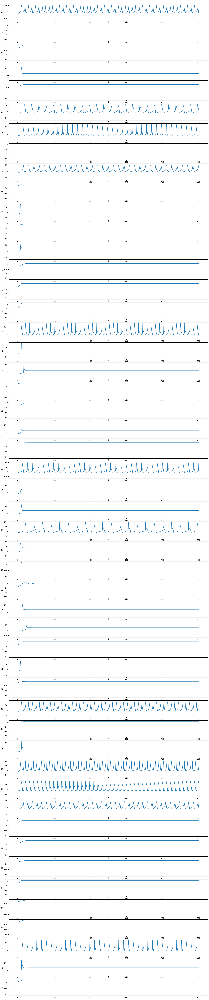

In [ ]:
num_p = 26 #number parameter
dt = 0.05
n = 50 #trials
t = np.arange(0, 500, dt)
fig, ax = plt.subplots(n, 1, figsize=(20,100))
HH_parameters = np.zeros([n, num_p])
for i in range(n):
  sol, p = generate_HH()
  ax[i].plot(t[:], sol[:, 0])
  ax[i].set_ylabel(i)
  ax[i].set_title(classify(sol[:,0], dt, 0.2))
  HH_parameters[i , :] = p

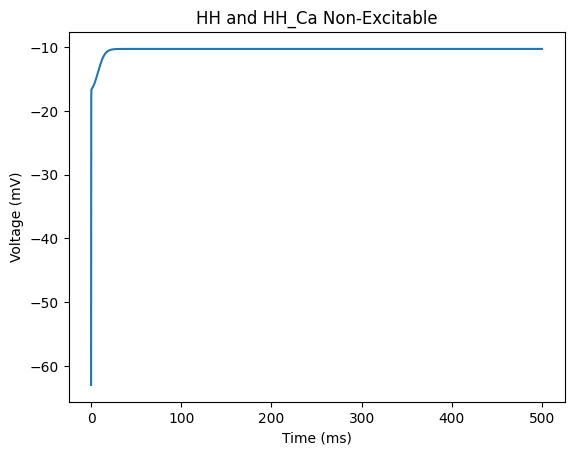

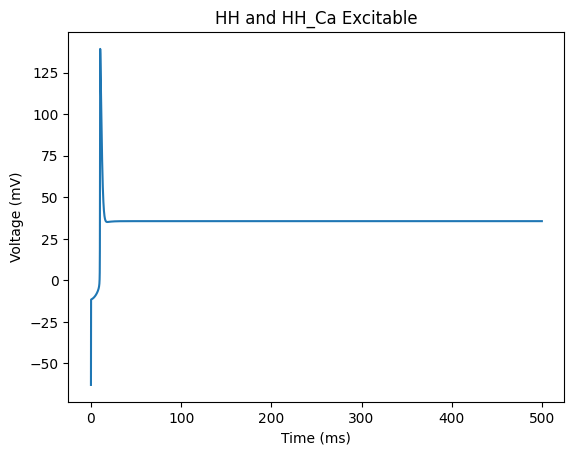

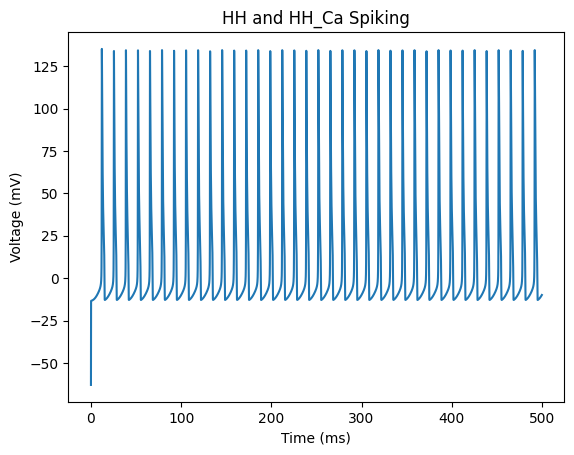

In [ ]:
HH_nonexcitable = HH_parameters[48, :]
HH_excitable =HH_parameters[49, :]
HH_spiking = HH_parameters[47, :]
HH_classifications = [HH_excitable, HH_nonexcitable, HH_spiking]
dt = 0.05
t = np.arange(0, 500, dt)
for i in range(3):
  plt.figure()
  plt.plot(t, simulate_HH(HH_classifications[i])[:, 0])
  plt.xlabel('Time (ms)')
  plt.ylabel('Voltage (mV)')
  plt.title(f'HH and HH_Ca {Classes[i]}')
  plt.savefig(f'HH and HH_Ca {Classes[i]}.jpg', format='jpg', dpi=300)

### HH with calcium dynamics

In [ ]:
dt = 0.02
relaxtime = 50
runfor = 40
wait = 20
pd = 1
t = np.arange(0, 500, dt)

def alpha(V, mu_alpha_x, epsilon_alpha_x, gamma_alpha_x, variable):
    #gating variable function at Voltage V calling parameters mu, epsilon, and gamma and the specific variable to call
    if variable == 'h':
      return mu_alpha_x * exp(epsilon_alpha_x - V / gamma_alpha_x)

    elif variable == 'm':
      return mu_alpha_x * (epsilon_alpha_x - V) / (exp((epsilon_alpha_x - V) / gamma_alpha_x) - 1)

    elif variable =='n':
      return mu_alpha_x * (epsilon_alpha_x - V) / (exp((epsilon_alpha_x - V) / gamma_alpha_x) - 1)



def beta(V, mu_beta_x, epsilon_beta_x, gamma_beta_x, variable):
    if variable == 'h':
      return mu_beta_x / (exp((epsilon_beta_x - V) / gamma_beta_x) + 1)
    elif variable == 'm':
      return mu_beta_x * exp(epsilon_beta_x - V / gamma_beta_x)
    elif variable == 'n':
      return mu_beta_x * exp((epsilon_beta_x - V) / gamma_beta_x)

def s_inf(c, k_s):
  c2 = c*c
  return c2/(c2 + k_s * k_s)


def HH_Ca(w, t, p):  # pragma: no cover


    # Unpack parameters
    [I_stim, g_Ca, E_Ca, g_K, E_K, g_L, E_L, C_m, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, mu_beta_h, epsilon_beta_h, gamma_beta_h, mu_beta_m, epsilon_beta_m, gamma_beta_m, mu_beta_n, epsilon_beta_n, gamma_beta_n, k_s, k_c, f, alpha_p, g_SK] = p
    V, n, m, h, c = w

    # The working variables are prefixed with "_"

    # Kinetic variables
    alpha_h = alpha(V, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, 'h')
    beta_h  = beta(V, mu_beta_h, epsilon_beta_h, gamma_alpha_h, 'h')

    alpha_m = alpha(V, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, 'm')
    beta_m = beta(V, mu_beta_m, epsilon_beta_m, gamma_beta_m, 'm')

    alpha_n = alpha(V, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, 'n')
    beta_n = beta(V, mu_beta_n, epsilon_beta_n, gamma_beta_n, 'n')

    # Compute the currents I_Na, I_K and I_Leak
    I_Ca = m ** 3 * h * g_Ca * (V - E_Ca)
    I_K = n ** 4 * g_K * (V - E_K)
    I_L = g_L * (V - E_L)
    I_SK = g_SK * s_inf(c, k_s) * (V - E_K)

    I = I_Ca + I_K + I_L - I_stim

    # Compute the four derivatices
    dV = (-I)/ C_m
    dn = alpha_n * (1 - n) - beta_n * n
    dm = alpha_m * (1 - m) - beta_m * m
    dh = alpha_h * (1 - h) - beta_h * h
    dc = -f * (alpha_p * I_Ca + k_c * c)

    return dV, dn, dm, dh, dc

def simulate_HH_Ca(p):

    [I_stim, g_Na, E_Na, g_K, E_K, g_L, E_L, C_m, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, mu_beta_h, epsilon_beta_h, gamma_beta_h, mu_beta_m, epsilon_beta_m, gamma_beta_m, mu_beta_n, epsilon_beta_n, gamma_beta_n, k_s, k_c, f, alpha_p, g_SK] = p

    # Initial conditions
    V = -63.0
    alpha_h = alpha(V, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, 'h')
    beta_h = beta(V, mu_beta_h, epsilon_beta_h, gamma_beta_h, 'h')
    alpha_m = alpha(V, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, 'm')
    beta_m = beta(V, mu_beta_m, epsilon_beta_m, gamma_beta_m, 'm')
    alpha_n = alpha(V, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, 'n')
    beta_n = beta(V, mu_beta_n, epsilon_beta_n, gamma_beta_n, 'n')
    n = alpha_n / (alpha_n + beta_n)
    m = alpha_m / (alpha_m + beta_m)
    h = alpha_h / (alpha_h + beta_h)

    w0 = (V, h, m, n, 0.1)

    abserr = 1.0e-8
    relerr = 1.0e-6

    dt = 0.05
    t = np.arange(0, 500, dt)

    wsol = odeint(HH_Ca, w0, t, args=(p,), atol=abserr, rtol=relerr)

    return wsol

def generate_HH_Ca():
    default = np.array([7, 120, 115, 36, -12, 0.3, 10.6, 1, 0.07, 0, 20, 0.1, 25, 10, 0.01, 10, 10, 1, 30, 10, 4, 0, 10, 0.125, 0, 80, 0.4, 0.1, 0.01, 0.0015, 2]) #k_s, k_c, f, alpha, g_SK
    p = np.zeros(31)
    for i in range(len(default)):
      if default[i] != 0:
        p[i] = default[i] * np.random.uniform(0.75, 1.25)
      elif default[i] == 0:
        p[i] = np.random.uniform(-0.1, 0.1)
    wsol = simulate_HH_Ca(p)
    return wsol, p

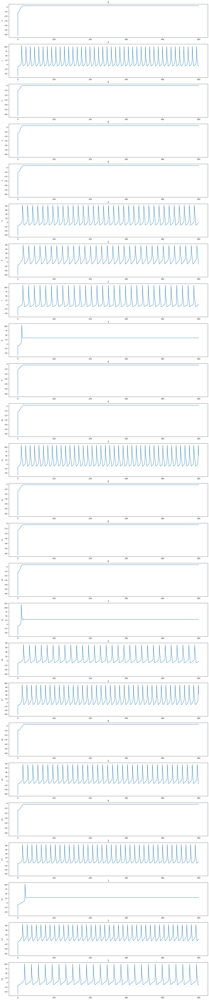

In [ ]:
num_p = 26 + 5 #number parameter
dt = 0.05
n = 25 #trials
t = np.arange(0, 500, dt)
fig, ax = plt.subplots(n, 1, figsize=(20,100))
HH_Ca_parameters = np.zeros([n, num_p])
for i in range(n):
  sol, p = generate_HH_Ca()
  ax[i].plot(t[:], sol[:, 0])
  ax[i].set_ylabel(i)
  ax[i].set_title(classify(sol[:,0], dt, 0.2))
  HH_Ca_parameters[i , :] = p

## Pituitary Gland from Wolf's Ori

$$s_\infty(c; k_s) = \frac{c^2}{c^2+k_s^2}$$
$$I_K(V,n;g_k,E_K)=g_K * n * (V - E_K)$$
$$I_{Ca}(V;g_{Ca}, \beta_m, \gamma_m, E_{Ca}) = g_{Ca}*x_\infty(V; \beta_m, \gamma_m) * (V - E_{Ca})$$
$$I_{SK}(V;g_{SK}, k_s, E_K) = g_{SK} * s_\infty(c; k_s) * (V - E_K)$$
$$I_{BK}(V,b;g_{BK},E_K)=g_{BK}*b*(V-E_K)$$
$$I_{leak}(V;g_{leak},E_{leak})=g_{leak}*(V-E_{leak})$$
$$\dot{V}=-\frac{I_K(V,n)+I_{Ca}(V)+I_{BK}(V,b)+I_{SK}(c)+I_{leak}(V)}{C_m}$$
$$\dot{n}=\frac{x_\infty(V;\beta_n,\gamma_n)}{\tau_n}$$
$$\dot{b}=\frac{x_\infty(V;\beta_b,\gamma_b)}{\tau_{BK}}$$
$$\dot{s}=-f_c * (\alpha * I_{Ca}(V) + k_c * c)$$
Parameters used $k_c, g_k, E_k, g_ca, \beta_m, \gamma_m, E_{Ca},g_{SK},E_K,g_{BK},g_{leak},E_{leak},C_m, \beta_n,\gamma_n, \tau_n, \beta_b, \gamma_b, \tau_{BK}, f_c, \alpha$<br>
Parameters varied: $C_m, g_{Ca}, g_k, g_{SK}, g_{BK}, \tau_m, \tau_n, \tau_{BK}, k_c$


The system is 4 dimensions, one for V_m, two gating variables for I_BK and I_K, and one for calcium dyanmics. No I_stim

Currently, error with odeint: too many arguments. Works fine with the modefied Wolf's code in funcion form.

In [ ]:
#pituitary full parameter sweep
#model
def pituitary_ode(w, t, p): #pituitary gland model function with w state variables, t autonomous time, p parameters
  V, n, b, c = w #state variables

  [C_m, g_Ca, g_K, g_SK, g_BK, g_leak, tau_m, tau_n, tau_BK, k_c, E_Ca, E_K, E_leak, beta_m, beta_n, beta_b, gamma_m, gamma_n, gamma_b, f_c, alpha,k_s] = p

  I_Ca = g_Ca * inf(V, beta_m, gamma_m) * (V - E_Ca) #Calcium current; used in calcium dynamics
  I = I_Ca + g_K * n * (V - E_K) + g_SK * s_inf(c, k_s) * (V - E_K) + g_BK * b * (V - E_K) + g_leak * (V - E_leak) # current sum of Ca, K, SK, BK, leak

  return -I / C_m, (inf(V, beta_n, gamma_n) - n) / tau_n, (inf(V, beta_b, gamma_b) - b) / tau_BK, -f_c * (alpha * I_Ca + k_c * c) #dV, dn, db, dc

def simulate_pituitary_ori_ode(p):
  [V, n, b, c] = [-60, 0.1, 0.1, 0.1] #initial conditions
  w0 = (V, n, b, c)

  [abserr, relerr] = [1.0e-8, 1.0e-6] #integration error parameters

  dt = 0.5 #integration time parameters
  t = np.arange(0, 50000, dt)

  wsol = odeint(pituitary_ode, w0, t, args=(p,), atol=abserr, rtol=relerr) #integration

  return wsol

def generate_pituitary_ori_ode():
    min_scale = np.array([6, .5, .8, .5, 0, 0.05, .7, 20, 2, 0.03])
    max_scale = np.array([12, 3.5, 5.6, 3.5, 4, 0.35, 1.3, 40, 10, 0.21])
    mean_scale = np.array([8, 2, 3.2, 2, 2, 0.2, 1, 20, 3, 0.12])
    [C_m_scale, g_Ca_scale, g_K_scale, g_SK_scale, g_BK_scale, g_leak_scale, tau_m_scale, tau_n_scale,
     tau_BK_scale, k_c_scale] = mean_scale * uniform_scale(min_scale, mean_scale, max_scale)
    #[E_Ca, E_K, E_leak, beta_m, beta_n, beta_b, gamma_m, gamma_n, gamma_b,, f_c, alpha, k_s]

    mean = np.array([60, -75, -50, -20, -5, -20, 12, 19, 2, 0.01, 0.0015, 0.4])
    [E_Ca, E_K, E_leak, beta_m, beta_n, beta_b, gamma_m, gamma_n, gamma_b, f_c, alpha, k_s] =np.random.uniform(0.95 * mean, 1.05 * mean)
    p = [C_m_scale, g_Ca_scale, g_K_scale, g_SK_scale, g_BK_scale, g_leak_scale,
         tau_m_scale, tau_n_scale, tau_BK_scale, k_c_scale, E_Ca, E_K, E_leak, beta_m, beta_n, beta_b, gamma_m, gamma_n, gamma_b, f_c, alpha, k_s]
    wsol = simulate_pituitary_ori_ode(p)
    return wsol, p

In [ ]:
#model
def pituitary_ode(w, t, p): #pituitary gland model function with w state variables, t autonomous time, p parameters
  V, n, b, c = w #state variables

  [C_m, g_Ca, g_K, g_SK, g_BK, g_leak, tau_m, tau_n, tau_BK, k_c] = p #parameters of capacitance, conductances, time constants, and calcium; varied

  [E_Ca, E_K, E_leak] = [60, -75, -50] #Nernst potentials

  [beta_m, beta_n, beta_b] = [-20, -5, -20] # steady state potentials p(open) = p(close)?

  [gamma_m, gamma_n, gamma_b] = [12, 19, 2] #steady state time constants?

  [f_c, alpha, k_s] = [0.01, 0.0015, 0.4] #calcium dynamics parameters

  I_Ca = g_Ca * inf(V, beta_m, gamma_m) * (V - E_Ca) #Calcium current; used in calcium dynamics
  I = I_Ca + g_K * n * (V - E_K) + g_SK * s_inf(c, k_s) * (V - E_K) + g_BK * b * (V - E_K) + g_leak * (V - E_leak) # current sum of Ca, K, SK, BK, leak

  return -I / C_m, (inf(V, beta_n, gamma_n) - n) / tau_n, (inf(V, beta_b, gamma_b) - b) / tau_BK, -f_c * (alpha * I_Ca + k_c * c) #dV, dn, db, dc

def simulate_pituitary_ori_ode(p):
  [V, n, b, c] = [-60, 0.1, 0.1, 0.1] #initial conditions
  w0 = (V, n, b, c)

  [abserr, relerr] = [1.0e-8, 1.0e-6] #integration error parameters

  dt = 0.5 #integration time parameters
  t = np.arange(0, 8000, 0.5)

  wsol = odeint(pituitary_ode, w0, t, args=(p,), atol=abserr, rtol=relerr) #integration

  return wsol

def generate_pituitary_ori_ode():
    min_scale = np.array([6, .5, .8, .5, 0, 0.05, .7, 20, 2, 0.03])
    max_scale = np.array([12, 3.5, 5.6, 3.5, 4, 0.35, 1.3, 40, 10, 0.21])
    mean_scale = np.array([8, 2, 3.2, 2, 2, 0.2, 1, 20, 3, 0.12])
    [C_m_scale, g_Ca_scale, g_K_scale, g_SK_scale, g_BK_scale, g_leak_scale, tau_m_scale, tau_n_scale,
     tau_BK_scale, k_c_scale] = mean_scale * uniform_scale(min_scale, mean_scale, max_scale)

    p = [C_m_scale, g_Ca_scale, g_K_scale, g_SK_scale, g_BK_scale, g_leak_scale,
         tau_m_scale, tau_n_scale, tau_BK_scale, k_c_scale]
    wsol = simulate_pituitary_ori_ode(p)
    return wsol, p

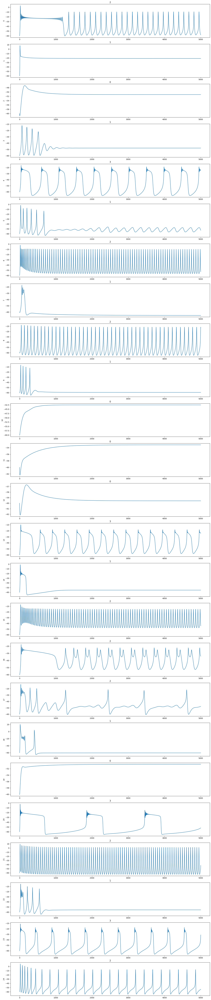

In [ ]:
num_p = 10#22
dt = 0.5
n = 25 #trials
t = np.arange(0, 8000, 0.5)
fig, ax = plt.subplots(n, 1, figsize=(20,100))
Pit_parameters = np.zeros([n, num_p])
for i in range(n):
  sol, p = generate_pituitary_ori_ode()
  ax[i].plot(t[:10000], sol[:10000, 0])
  ax[i].set_ylabel(i)
  ax[i].set_title(classify(sol[:,0], dt, 5))
  Pit_parameters[i , :] = p

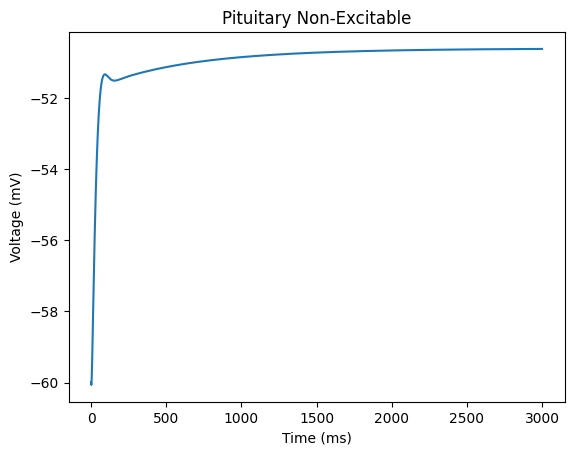

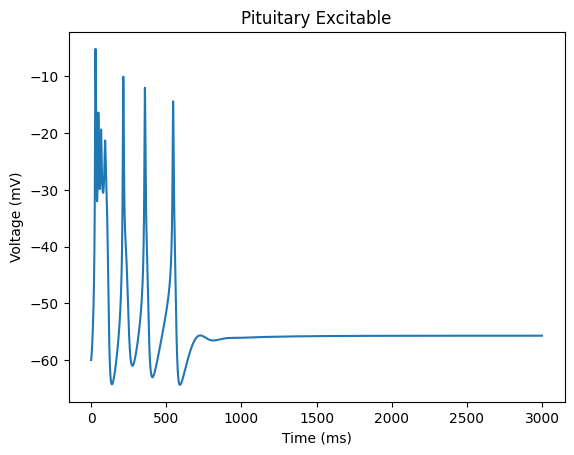

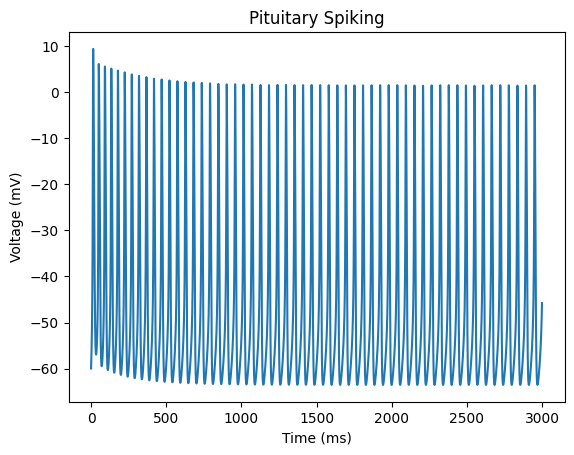

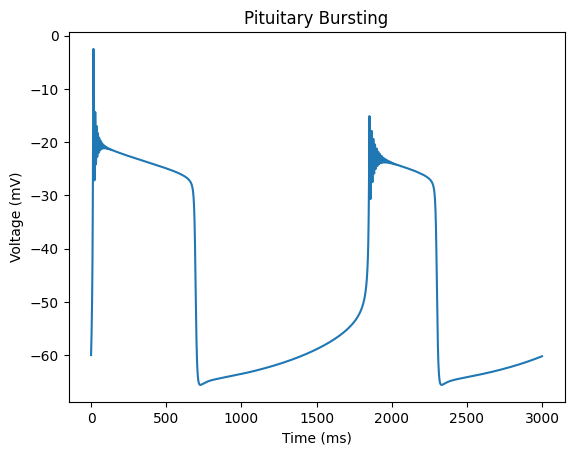

In [ ]:
Pit_non = Pit_parameters[19, :]
Pit_excitable = Pit_parameters[22, :]
Pit_spiking = Pit_parameters[21, :]
Pit_bursting = Pit_parameters[20, :]
Pit_classifications = [Pit_non, Pit_excitable, Pit_spiking, Pit_bursting]
t = np.arange(0, 8000, 0.5)
Classes = ['Non-Excitable', 'Excitable', 'Spiking', 'Bursting']
for i in range(4):
  plt.figure()
  plt.plot(t[:6000], simulate_pituitary_ori_ode(Pit_classifications[i])[:6000,0])
  plt.ylabel('Voltage (mV)')
  plt.xlabel('Time (ms)')
  plt.title(f'Pituitary {Classes[i]}')
  plt.savefig(f'Pituitary {Classes[i]}.jpg', format='jpg', dpi=300)

## ML

In [ ]:
def ML(w, t, p):

    V, y= w

    [C_m, E_Na, E_K, E_L, g_Na, g_K, g_L, I_stim, beta_m, beta_n, gamma_m, gamma_n, phi_n] = p

    dV = (I_stim - g_Na * inf_tanh(V, beta_m, gamma_m) * (V - E_Na) - g_K * n * (V - E_K)  - g_L * (V - E_L))/ C_m
    dn = phi_n * (inf_tanh(V, beta_n, gamma_n) - y) / tau(V, beta_n, gamma_n)
    return dV, dn

def simulate_ML(p):

    # Initial conditions
    [V, y] = [-60.0, 0.1]

    w0 = (V, y)

    abserr = 1.0e-8
    relerr = 1.0e-6

    dt = 0.05
    t = np.arange(0, 500, dt)

    wsol = odeint(ML, w0, t, args=(p,), atol=abserr, rtol=relerr)

    return wsol

def generate_ML():
    norm =   [2, 50, -100, -70, 20, 20, 2, 60, -1.2, -11, 18, 10, 0.15]
    Adjustment = np.random.uniform(0.5, 1.5, 13)

    p = norm * Adjustment
    wsol = simulate_ML(p)
    return wsol, p

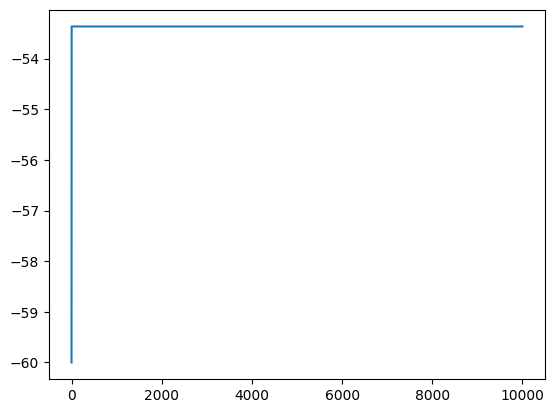

In [ ]:
sol, p =generate_ML()
plt.plot(sol[:,0])

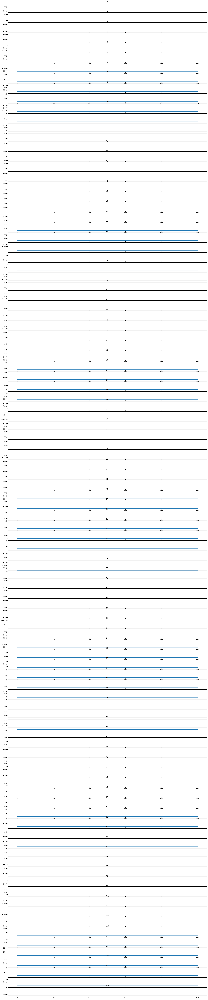

In [ ]:
fig, ax = plt.subplots(100, 1, figsize=(20,100))
dt = 0.05
t = np.arange(0, 500, dt)
for i in range(100):
  sol, p = generate_ML()
  ax[i].plot(t[:], sol[:, 0])
  ax[i].set_title(i)

## Coding ML 3D model from Prescott et al. 2008 again

$$C\dot{V}=I_{stim}-\bar{g}_{fast}m_\infty(V)(V-E_{Na})-\bar{g}_{K,dr}y(V - E_K)-\bar{g}_{sub}z(V-E_{sub})-\bar{g}_{leak}(V-E_{leak})$$
$$\dot{y}=\phi_y\Bigl(\frac{y_\infty(V)-y}{\tau_y(V)}\Bigr)$$
$$y_\infty(V)=0.5\Bigl(1+\tanh\Bigl(\frac{V-\beta_y}{\gamma_y}\Bigr)\Bigr)$$
$$\tau_y(V)=1/\cosh\Bigl(\frac{V-\beta_y}{\gamma_y}\Bigr)$$
$$\dot{z}=\phi_z\Bigl(\frac{z_\infty(V)-y}{\tau_z(V)}\Bigr)$$
$$z_\infty(V)=0.5\Bigl(1+\tanh\Bigl(\frac{V-\beta_z}{\gamma_z}\Bigr)\Bigr)$$
$$\tau_z(V)=1/\cosh\Bigl(\frac{V-\beta_z}{2\gamma_z}\Bigr)$$

In [ ]:
def ML_3D(w, t, p):

    V, y, z = w

    [C_m, E_Na, E_K, E_sub, E_leak, g_Na, g_K_dr, g_sub, g_leak, I_stim, beta_m, beta_y, beta_z, gamma_m, gamma_y, gamma_z, phi_y, phi_z] = p #direction for inward/outward current

    dV = (I_stim - g_Na * inf_tanh(V, beta_m, gamma_m) * (V - E_Na) - g_K_dr * y * (V - E_K) - g_sub * z * (V - E_sub) - g_leak * (V - E_leak))/ C_m
    dy = phi_y * (inf_tanh(V, beta_y, gamma_y) - y) / tau(V, beta_y, gamma_y)
    dz = phi_z * (inf_tanh(V, beta_z, gamma_z) - z) / tau(V, beta_z, gamma_z)
    return dV, dy, dz

def simulate_ML_3D(p):

    # Initial conditions
    [V, y, z] = [-60.0, 0.1, 0.1]

    w0 = (V, y, z)

    abserr = 1.0e-8
    relerr = 1.0e-6

    dt = 0.05
    t = np.arange(0, 500, dt)

    wsol = odeint(ML_3D, w0, t, args=(p,), atol=abserr, rtol=relerr)

    return wsol

def generate_ML_3D():
    norm = [2, 50, -100, 50, -70, 20, 20, 0.5, 2, 50, -1.2, -10, -21, 10, 10, 15, 0.15, 0.5]
    Adjustment = np.random.uniform(0.5, 1.5, 18)

    p = norm * Adjustment
    wsol = simulate_ML_3D(p)
    return wsol, p

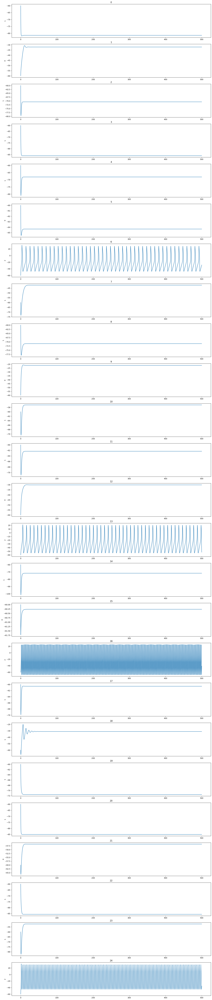

In [ ]:
fig, ax = plt.subplots(25, 1, figsize=(20,100))
dt = 0.05
t = np.arange(0, 500, dt)
ML_3D_parameters = np.zeros([100, 18])
traces = np.zeros([100, 10000])
for i in range(25):
  sol, p = generate_ML_3D()
  ax[i].plot(t[:], sol[:, 0])
  ax[i].set_title(i)
  ML_3D_parameters[i , :] = p
  ax[i].set_ylabel(classify(sol[:,0], dt, 0.2))

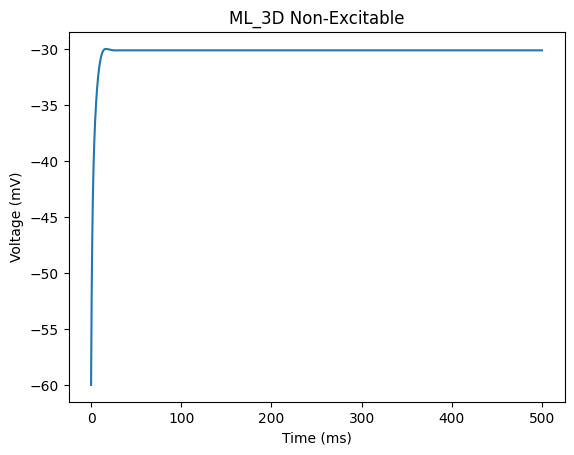

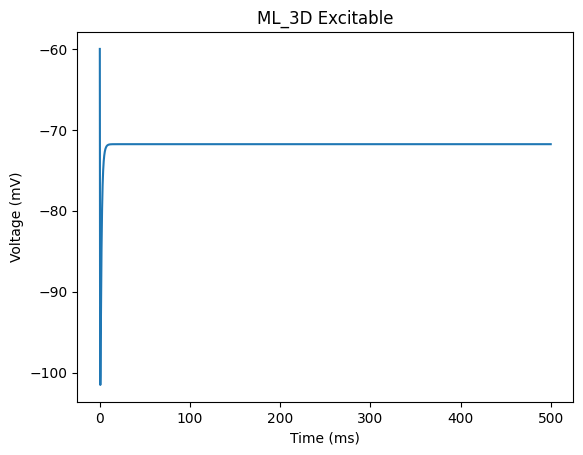

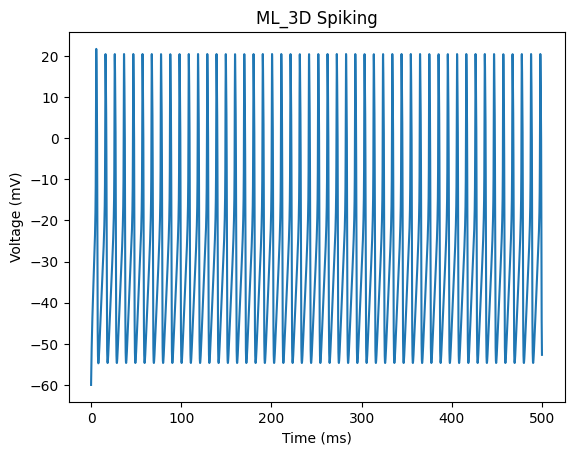

In [ ]:
ML_3D_excitable = ML_3D_parameters[14 , :]
ML_3D_non =ML_3D_parameters[12, :]
ML_3D_spiking =ML_3D_parameters[13, :]
t = np.arange(0, 500, dt)
ML_3D_classifications = [ML_3D_non, ML_3D_excitable, ML_3D_spiking]
for i in range(3):
  plt.figure()
  plt.plot(t, simulate_ML_3D(ML_3D_classifications[i])[:,0])
  plt.ylabel('Voltage (mV)')
  plt.xlabel('Time (ms)')
  plt.title(f'ML_3D {Classes[i]}')
  plt.savefig(f'ML_3D {Classes[i]}.jpg', format='jpg', dpi=300)

## Morris Lecar with Calcium Dynamics

$$C_m*\dot{V}=I_{stim}-g_{leak}*(V-E_{leak})-g_K*n*(V-E_K)-g_{Ca}*x_{(\infty, \ \tanh)}(V,\beta_m\gamma_m)*(V-E_{Ca})-g_{KCa}*z([Ca];g_{K,Ca})*(V-E_K)$$
$$\dot{n}=\phi*\frac{x_{(\infty,\ \tanh)}(V,\beta_n,\gamma_n)-n}{\tau_n}$$
$$\dot{[Ca]}=\epsilon*(-\mu*I_{Ca}-K_{Ca}*[Ca])$$


from https://www.scirp.org/journal/paperinformation?paperid=98892#t2

In [ ]:
#phi, g_Ca, g_KCa, V_3, V_4, epsilon, mu, I_stim, E_Ca, E_K, E_L, g_K, g_L, V_1, V_2, C_m, K_Ca

square = [0.04, 4, 0.75, 12, 17.4, 0.1, 0.02, 45.0, 120, -84, -60, 8, 2, -1.2, 18, 1, 1]
elliptical = [0.067, 4.4, 1, 2, 30, 0.04, 0.01667, 120, 120, -84, -60, 8, 2, -1.2, 18, 1, 1]
parabolic = [0.23, 4, 1, 12, 17.4, 0.01, 0.025, 65, 120, -84, -60, 8, 2, -1.2, 18, 1, 1]


def ML_3D_Ca(w, t, p):

    V, n, Ca = w
    Hill = 3 #Hill Coefficient
    [phi, g_Ca, g_KCa, beta_n, gamma_n, epsilon, mu, I_stim, E_Ca, E_K, E_L, g_K, g_L, beta_m, gamma_m, C_m, K_Ca] = p

    dV = (I_stim - g_Ca * inf_tanh(V, beta_m, gamma_m) *in (V - E_Ca) - g_K * n * (V - E_K) - g_KCa * Ca ** Hill / (Ca ** Hill + 1) * (V - E_K) - g_L * (V - E_L))/ C_m
    dn = phi * (inf(V, beta_n, gamma_n) - n) / tau(V, beta_n, gamma_n)
    dCa = -epsilon * (mu * g_Ca * inf(V, beta_m, gamma_m) * (V - E_Ca) - K_Ca * Ca)
    return dV, dn, dCa

def simulate_ML_3D_Ca(p):

    # Initial conditions
    [V, n, Ca] = [-60.0, 0.1, 0.1]

    w0 = (V, n, Ca)

    abserr = 1.0e-8
    relerr = 1.0e-6

    dt = 0.05
    t = np.arange(0, 500, dt)

    wsol = odeint(ML_3D_Ca, w0, t, args=(p,), atol=abserr, rtol=relerr)

    return wsol

def generate_ML_3D_Ca():
  #phi, g_Ca, g_KCa, V_3, V_4, epsilon, mu, I_stim, E_Ca, E_K, E_L, g_K, g_L, V_1, V_2, C_m, K_Ca
    norm = [0.04, 4, 1, 12, 17.4, 0.01, 0.025, 80, 120, -84, -60, 8, 2, -1.2, 18, 1, 1]
    Adjustment = np.append(np.random.uniform(0.3, 1.7, 8),np.ones(9))

    p = norm * Adjustment
    wsol = simulate_ML_3D_Ca(p)
    return wsol, p

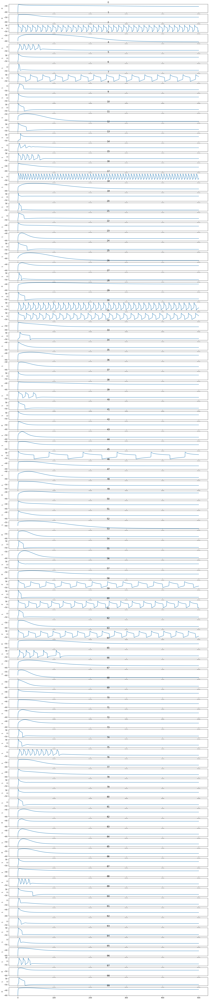

In [ ]:
fig, ax = plt.subplots(100, 1, figsize=(20,100))
dt = 0.05
t = np.arange(0, 500, dt)
ML_Ca_parameters = np.zeros([100, 17])
traces = np.zeros([100, 10000])
for i in range(100):
  sol, p = generate_ML_3D_Ca()
  ax[i].plot(t[:], sol[:, 0])
  ax[i].set_title(i)
  ML_Ca_parameters[i , :] = p
  ax[i].set_ylabel(classify(sol[:,0], dt, 0.2))

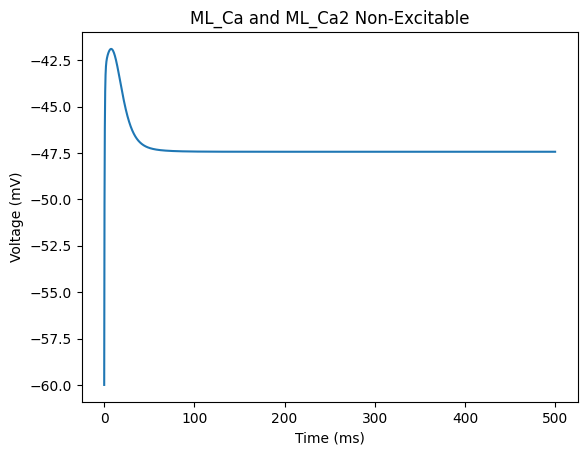

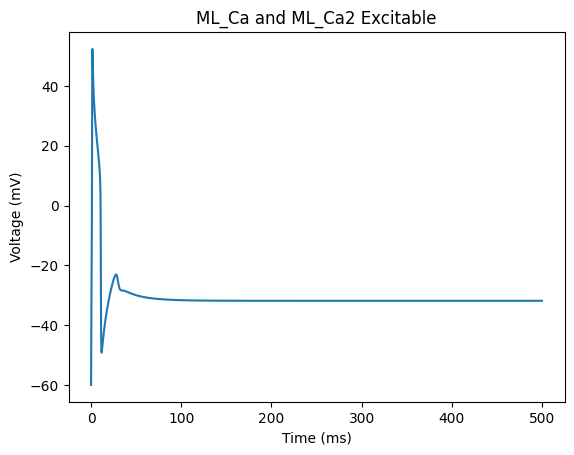

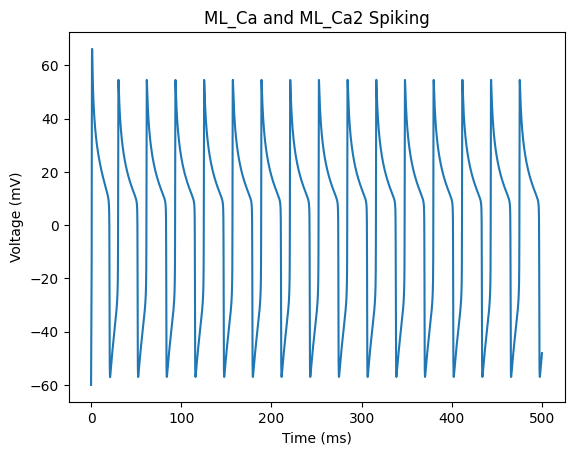

In [ ]:
ML_Ca_non = ML_Ca_parameters[97,:]
ML_Ca_excitable = ML_Ca_parameters[74, :]
ML_Ca_spiking = ML_Ca_parameters[60, :]
t = np.arange(0, 500, dt)
Classes = ['Non-Excitable', 'Excitable', 'Spiking']
ML_Ca_classifications = [ML_Ca_non, ML_Ca_excitable, ML_Ca_spiking]
for i in range(3):
  plt.figure()
  plt.plot(t, simulate_ML_3D_Ca(ML_Ca_classifications[i])[:,0])
  plt.ylabel('Voltage (mV)')
  plt.xlabel('Time (ms)')
  plt.title(f'ML_Ca and ML_Ca2 {Classes[i]}')
  plt.savefig(f'ML_Ca and ML_Ca2 {Classes[i]}.jpg', format='jpg', dpi=300)

## Morris-Lecar with two calcium 'variables'

$$C_m*\dot{V}=I_{stim}-g_{leak}*(V-E_{leak})-g_K*n*(V-E_K)-g_{Ca}*x_{(\infty, \ \tanh)}(V,\beta_m\gamma_m)*(V-E_{Ca})-g_{KCa}*z([Ca];g_{K,Ca})*(V-E_K)-g_{CaS}*s*(V-E_{Ca})$$
$$\dot{n}=\phi*\frac{x_{(\infty,\ \tanh)}(V,\beta_n,\gamma_n)-n}{\tau_n}$$
$$\dot{[Ca]}=\epsilon*(-\mu*I_{Ca}-K_{Ca}*[Ca])$$
$$\dot{s}=\epsilon*\frac{x_\infty(V,\beta_s,\gamma_s)-s}{\tau_s}$$
$$I_{Ca} = g_{Ca}*x_{(\infty, \ \tanh)}(V,\beta_m\gamma_m)*(V-E_{Ca})$$


from https://www.scirp.org/journal/paperinformation?paperid=98892#t2

In [ ]:
#phi, g_Ca, g_KCa, V_3, V_4, epsilon, mu, I_stim, E_Ca, E_K, E_L, g_K, g_L, V_1, V_2, C_m, K_Ca, epsilon, mu, tau_s, g_CaS, beta_s, 1


parabolic2 = [0.23, 4, 1, 12, 17.4, 0.01, 0.025, 65, 120, -84, -60, 8, 2, -1.2, 18, 1, 1, 0.01, 0.025, 0.05, 1, 12]


def x_inf(V, beta_x, gamma_x):
    return 0.5 * (1 + np.tanh((V - beta_x) / gamma_x))


def tau_x(V, beta_x, gamma_x):
  return 1 / np.cosh((V - beta_x) / (2 * gamma_x))


def ML_3D_Ca2(w, t, p):

    V, n, Ca, s = w
    Hill = 1 #Hill Coefficient
    [phi, g_Ca, g_KCa, beta_n, gamma_n, epsilon, mu, I_stim, E_Ca, E_K, E_L, g_K, g_L, beta_m, gamma_m, C_m, K_Ca, tau_s, g_CaS, beta_s] = p

    dV = (I_stim - g_Ca * inf_tanh(V, beta_m, gamma_m) * (V - E_Ca) - g_K * n * (V - E_K) - g_KCa * Ca ** Hill / (Ca ** Hill + 1) * (V - E_K) - g_L * (V - E_L) - g_CaS * s * (V - E_Ca))/ C_m
    dn = phi * (inf_tanh(V, beta_n, gamma_n) - n) / tau(V, beta_n, gamma_n)
    dCa = -epsilon * (mu * g_Ca * inf_tanh(V, beta_m, gamma_m) * (V - E_Ca) - K_Ca * Ca)
    ds = epsilon * (0.5 * (1 + np.tanh(V - 12) / 24) - s)/tau_s
    return dV, dn, dCa, ds

def simulate_ML_3D_Ca2(p):

    # Initial conditions
    [V, n, Ca, s] = [-60.0, 0.1, 0.1, 0.1]

    w0 = (V, n, Ca, s)

    abserr = 1.0e-8
    relerr = 1.0e-6

    dt = 0.05
    t = np.arange(0, 500, dt)

    wsol = odeint(ML_3D_Ca2, w0, t, args=(p,), atol=abserr, rtol=relerr)

    return wsol

def generate_ML_3D_Ca2():
    norm = [0.04, 4, 1, 12, 17.4, 0.01, 0.025, 80, 120, -84, -60, 8, 2, -1.2, 18, 1, 1, 0.05, 1, 12]
    Adjustment = np.random.uniform(0.3, 1.7, 20)

    p = norm * Adjustment
    wsol = simulate_ML_3D_Ca2(p)
    return wsol, p

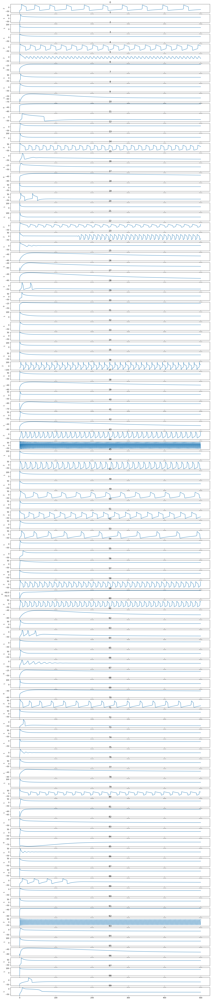

In [ ]:
fig, ax = plt.subplots(100, 1, figsize=(20,100))
dt = 0.05
t = np.arange(0, 500, dt)
parameters = np.zeros([100, 20])
traces = np.zeros([100, 10000])
for i in range(100):
  sol, p = generate_ML_3D_Ca2()
  ax[i].plot(t[:], sol[:, 0])
  ax[i].set_title(i)
  parameters[i , :] = p
  ax[i].set_ylabel(classify(sol[:,0], dt, 0.2))

## Morris-Lecar Feedback control current

from 'Bursting of Morris-Lecar neuronal model with
current-feedback control' 2009 Dang et al.

In [ ]:
# epsilon, V_K, V_leak, g_K, g_Ca, g_leak, C_m, V_1, V_2, V_3, V_4, phi
base = [0.001, -84, -60, 8, 4, 2, 20, -1.2, 18, 12, 17.4, 0.23]
# I_stim, V_Ca, V_0
vary_min = [-40, 60]
V_0 = [-26, -22]
vary_max = [60, 160]

def x_inf(V, beta_x, gamma_x):
    return 0.5 * (1 + np.tanh((V - beta_x) / gamma_x))


def tau_x(V, beta_x, gamma_x):
    return 1 / np.cosh((V - beta_x) / (2 * gamma_x))


def MLF(w, t, p):

    V, y, I = w
    [V_0, V_Ca, epsilon, V_K, V_L, g_K, g_Ca, g_L, C_m, beta_m, gamma_m, beta_y, gamma_y, phi] = p
    epsilon = 0.001

    dV = (I - g_Ca * x_inf(V, beta_m, gamma_m) * (V - V_Ca) - g_K * y * (V - V_K) - g_L * (V - V_L))/ C_m
    dy = phi * (x_inf(V, beta_y, gamma_y) - y) / tau_x(V, beta_y, gamma_y)
    dI = epsilon * (V_0 - V)
    return dV, dy, dI

def simulate_MLF(p):

    # Initial conditions
    [V, y, I] = [-60.0, 0.1, 100]

    w0 = (V, y, I)

    abserr = 1.0e-8
    relerr = 1.0e-6

    dt = 0.05
    t = np.arange(0, 500, dt)

    wsol = odeint(MLF, w0, t, args=(p,), atol=abserr, rtol=relerr)

    return wsol



## Full parameter sweep

In [ ]:
#def generate_MLF_full():
#    norm = np.array([0.001, -84, 8, 4, 2, 20, -1.2, 18, 12, 17.4, 0.23])
#    #V_0, V_Ca, epsilon, V_K, V_L, g_K, g_Ca, g_L, C_m, beta_m, gamma_m, beta_n, gamma_n, phi
#    adjusted_norm = np.random.uniform(.5, 1.5, 11) * norm
#    a = np.random.uniform([-18, 0, 60], [-30, 60, 160])
#
#    p = np.append(a, adjusted_norm)
#    wsol = simulate_MLF(p)
#    return wsol, p

def generate_MLF_full():
    norm = np.array([-24, 30, 100, 0.001, -84, 8, 4, 2, 20, -1.2, 18, 12, 17.4, 0.23])
    #V_0, V_Ca, epsilon, V_K, V_L, g_K, g_Ca, g_L, C_m, beta_m, gamma_m, beta_n, gamma_n, phi
    adjusted_norm = np.random.uniform(.5, 1.5, 14) * norm
    #a = np.random.uniform([-18, 0, 60], [-30, 60, 160])

    #p = np.append(a, adjusted_norm)
    p =adjusted_norm
    wsol = simulate_MLF(p)
    return wsol, p

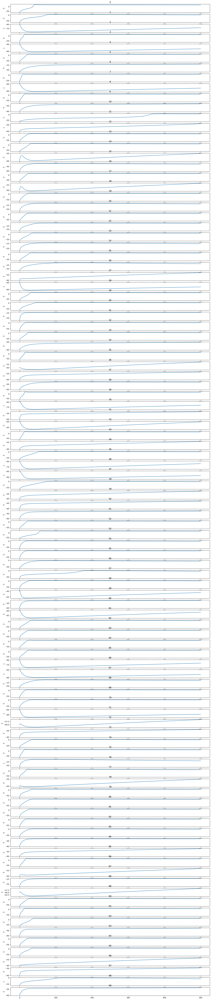

In [ ]:
n = 100
fig, ax = plt.subplots(n, 1, figsize=(20,100))
dt = 0.05
t = np.arange(0, 500, dt)
MLF_parameters = np.zeros([100, 14])
traces = np.zeros([100, 10000])
for i in range(n):
  sol, p = generate_MLF_full()
  ax[i].set_ylabel(classify(sol[:,0], dt, 0.2))
  ax[i].plot(t[:], sol[:, 0])
  ax[i].set_title(i)
  MLF_parameters[i , :] = p


In [ ]:
num_p = 14 #number parameter
dt = 0.05
n = 1000 #trials
MLF_results = np.zeros([n, num_p + 1])
for i in range(n):
  sol, p = generate_MLF_full()
  classification = classify(sol[:,0], dt, 0.8)
  MLF_results[i , :-1] = p
  MLF_results[i, -1] = classification

unique, counts = np.unique(MLF_results[:, -1], return_counts=True)
dict(zip(unique, counts)) #all 3 are 1

{0.0: 1000}

# Results

In [ ]:
#universal functions
def inf(V, beta_x, gamma_x): #steady state function
    return 1 / (1 + exp((beta_x - V) / gamma_x))

def inf_tanh(V, beta_x, gamma_x): #steady state function with tanh
    return 0.5 * (1 + np.tanh((V - beta_x) / gamma_x))

def tau(V, beta_x, gamma_x):
  return 1 / np.cosh((V - beta_x) / (2 * gamma_x))

def s_inf(c, k_s): #steady state calcium function
    return c ** 2 / (c ** 2 + k_s ** 2)

def uniform_scale(min, mean, max): #random scaled sample from uniform
  return np.random.uniform(min / mean, max / mean)

In [ ]:
def classify_HH(V, dt, bursting_threshold = 30):
  """This Algorithm is for the classification of a voltage trace as either non-excitable, excitable
  spiking, or bursting. It uses detect_peaks which detects the start and the end of the first event
  in a voltage trace 3 times. First to check if excitable, second and third times during asymptotic
  behaviour to see if it is just excitable or if it is spiking or burst. Excitable is detected if
  there are 3 or more events. Works for HH and HH_Ca"""
  n_after_200_ms = int(200 / dt)
  if detect_peak(V, dt) == 0:
    return 0 #non-excitable
  else:
    a = detect_peak(V, dt, n_after_200_ms)
    if a == 0:
      return 1
    else:
      event_end = a[1]
      if detect_peak(V, dt, event_end) == 0:
        return 1
      else:
        event_start = a[0]
        b = detect_peak(V, dt, event_start, bursting_threshold)
        if b == 0:
          return 2
        else:
          if detect_peak(V, dt, event_start + b[1], bursting_threshold) == 0:
            return 2 #spiking check
          else:
            return 3 #bursting

def detect_peak(V, dt, search_start = 0, detection_threshold = 30): #detects the first event in an array
  """This algorithm takes the original voltage trace and a starting point to see what the next
  event and start is by seeing the position the voltage trace is above the spiking threshold defined
  by a detection_threshold over equilibrium potential which is the minimum of asymptotic behaviour."""
  after_200_ms = V[int(200 / dt):]
  equilibrium_potential = np.min(after_200_ms)
  spiking_threshold = 30 + equilibrium_potential
  activation_threshold = detection_threshold + equilibrium_potential
  peaks = V[search_start:] > spiking_threshold
  activation = V[search_start:] > activation_threshold
  if np.all(peaks==False):
    return 0
  else:
    peaks_true = np.where(True==peaks)
    position = peaks_true[0][0] + search_start #goes to first place where peak
    i = 0
    while (position - i > 0 and V[position - i] > activation_threshold):
      i += 1
    if position - i < 10:
      return 0
    else:
      event_start = position - i
    i = 0
    while (position + i < len(after_200_ms) and V[position + i] > activation_threshold):
      i += 1
    if position + i > len(after_200_ms) - 10:
      return 0
    else:
      event_end = position + i
      return [event_start, event_end]

## Models

In [ ]:
#Hodgkin-Huxley
dt = 0.02
relaxtime = 50
runfor = 40
wait = 20
pd = 1
t = np.arange(0, 500, dt)

def alpha(V, mu_alpha_x, epsilon_alpha_x, gamma_alpha_x, variable):
    #gating variable function at Voltage V calling parameters mu, epsilon, and gamma and the specific variable to call
    if variable == 'h':
      return mu_alpha_x * exp(epsilon_alpha_x - V / gamma_alpha_x)

    elif variable == 'm':
      return mu_alpha_x * (epsilon_alpha_x - V) / (exp((epsilon_alpha_x - V) / gamma_alpha_x) - 1)

    elif variable =='n':
      return mu_alpha_x * (epsilon_alpha_x - V) / (exp((epsilon_alpha_x - V) / gamma_alpha_x) - 1)



def beta(V, mu_beta_x, epsilon_beta_x, gamma_beta_x, variable):
    if variable == 'h':
      return mu_beta_x / (exp((epsilon_beta_x - V) / gamma_beta_x) + 1)
    elif variable == 'm':
      return mu_beta_x * exp(epsilon_beta_x - V / gamma_beta_x)
    elif variable == 'n':
      return mu_beta_x * exp((epsilon_beta_x - V) / gamma_beta_x)

#def HH(w, t, p):
#
#    V, h, m, n = w
#
#    [I_stim, g_Na, E_Na, g_K, E_K, g_L, E_L, C_m, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, mu_beta_h, epsilon_beta_h, gamma_beta_h, mu_beta_m, epsilon_beta_m, gamma_beta_m, mu_beta_n, epsilon_beta_n, gamma_beta_n] = p
#    #26 parameters, 8 structural, 18 kinetic
#    dV = (I_stim - g_Na * m ** 3 * h * (V - E_Na) - g_K * n ** 4 * (V - E_K) - g_L * (V - E_L))/ C_m
#    dh = alpha(V, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, 'h') * (1 - h) - beta(V, mu_beta_h, epsilon_beta_h, gamma_beta_h, 'h')
#    dm = alpha(V, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, 'm') * (1 - m) - beta(V, mu_beta_m, epsilon_beta_m, gamma_beta_m, 'm')
#    dn = alpha(V, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, 'n') * (1 - n) - beta(V, mu_beta_n, epsilon_beta_n, gamma_beta_n, 'n')
#    return dV, dh, dm, dn

def HH(w, t, p):  # pragma: no cover


    # Unpack parameters
    [I_stim, g_Na, E_Na, g_K, E_K, g_L, E_L, C_m, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, mu_beta_h, epsilon_beta_h, gamma_beta_h, mu_beta_m, epsilon_beta_m, gamma_beta_m, mu_beta_n, epsilon_beta_n, gamma_beta_n] = p
    V, n, m, h = w

    # The working variables are prefixed with "_"

    # Kinetic variables
    alpha_h = alpha(V, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, 'h')
    beta_h  = beta(V, mu_beta_h, epsilon_beta_h, gamma_alpha_h, 'h')

    alpha_m = alpha(V, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, 'm')
    beta_m = beta(V, mu_beta_m, epsilon_beta_m, gamma_beta_m, 'm')

    alpha_n = alpha(V, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, 'n')
    beta_n = beta(V, mu_beta_n, epsilon_beta_n, gamma_beta_n, 'n')

    # Compute the currents I_Na, I_K and I_Leak
    I_Na = m ** 3 * h * g_Na * (V - E_Na)
    I_K = n ** 4 * g_K * (V - E_K)
    I_L = g_L * (V - E_L)

    # Determine whether to apply extra current (to kick off the reaction)
    if relaxtime + wait < t and t < relaxtime + wait + pd:
        I_injected = I_stim
    else:
        I_injected = 0

    I = I_Na + I_K + I_L - I_injected

    # Compute the four derivatices
    dV = (-I)/ C_m
    dn = alpha_n * (1 - n) - beta_n * n
    dm = alpha_m * (1 - m) - beta_m * m
    dh = alpha_h * (1 - h) - beta_h * h

    return dV, dn, dm, dh

def simulate_HH(p):

    [I_stim, g_Na, E_Na, g_K, E_K, g_L, E_L, C_m, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, mu_beta_h, epsilon_beta_h, gamma_beta_h, mu_beta_m, epsilon_beta_m, gamma_beta_m, mu_beta_n, epsilon_beta_n, gamma_beta_n] = p

    # Initial conditions
    V = -63.0
    alpha_h = alpha(V, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, 'h')
    beta_h = beta(V, mu_beta_h, epsilon_beta_h, gamma_beta_h, 'h')
    alpha_m = alpha(V, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, 'm')
    beta_m = beta(V, mu_beta_m, epsilon_beta_m, gamma_beta_m, 'm')
    alpha_n = alpha(V, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, 'n')
    beta_n = beta(V, mu_beta_n, epsilon_beta_n, gamma_beta_n, 'n')
    n = alpha_n / (alpha_n + beta_n)
    m = alpha_m / (alpha_m + beta_m)
    h = alpha_h / (alpha_h + beta_h)

    w0 = (V, h, m, n)

    abserr = 1.0e-8
    relerr = 1.0e-6

    dt = 0.05
    t = np.arange(0, 500, dt)

    wsol = odeint(HH, w0, t, args=(p,), atol=abserr, rtol=relerr)

    return wsol

def generate_HH():
    default = np.array([7, 120, 115, 36, -12, 0.3, 10.6, 1, 0.07, 0, 20, 0.1, 25, 10, 0.01, 10, 10, 1, 30, 10, 4, 0, 10, 0.125, 0, 80])
    p = np.zeros(26)
    for i in range(len(default)):
      if default[i] != 0:
        p[i] = default[i] * np.random.uniform(0.75, 1.25)
      elif default[i] == 0:
        p[i] = np.random.uniform(-0.1, 0.1)
    wsol = simulate_HH(p)
    return wsol, p

In [ ]:
#Hodgkin Huxley Calcium
dt = 0.02
relaxtime = 50
runfor = 40
wait = 20
pd = 1
t = np.arange(0, 500, dt)

def alpha(V, mu_alpha_x, epsilon_alpha_x, gamma_alpha_x, variable):
    #gating variable function at Voltage V calling parameters mu, epsilon, and gamma and the specific variable to call
    if variable == 'h':
      return mu_alpha_x * exp(epsilon_alpha_x - V / gamma_alpha_x)

    elif variable == 'm':
      return mu_alpha_x * (epsilon_alpha_x - V) / (exp((epsilon_alpha_x - V) / gamma_alpha_x) - 1)

    elif variable =='n':
      return mu_alpha_x * (epsilon_alpha_x - V) / (exp((epsilon_alpha_x - V) / gamma_alpha_x) - 1)



def beta(V, mu_beta_x, epsilon_beta_x, gamma_beta_x, variable):
    if variable == 'h':
      return mu_beta_x / (exp((epsilon_beta_x - V) / gamma_beta_x) + 1)
    elif variable == 'm':
      return mu_beta_x * exp(epsilon_beta_x - V / gamma_beta_x)
    elif variable == 'n':
      return mu_beta_x * exp((epsilon_beta_x - V) / gamma_beta_x)

def s_inf(c, k_s):
  c2 = c*c
  return c2/(c2 + k_s * k_s)


def HH_Ca(w, t, p):  # pragma: no cover


    # Unpack parameters
    [I_stim, g_Ca, E_Ca, g_K, E_K, g_L, E_L, C_m, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, mu_beta_h, epsilon_beta_h, gamma_beta_h, mu_beta_m, epsilon_beta_m, gamma_beta_m, mu_beta_n, epsilon_beta_n, gamma_beta_n, k_s, k_c, f, alpha_p, g_SK] = p
    V, n, m, h, c = w

    # The working variables are prefixed with "_"

    # Kinetic variables
    alpha_h = alpha(V, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, 'h')
    beta_h  = beta(V, mu_beta_h, epsilon_beta_h, gamma_alpha_h, 'h')

    alpha_m = alpha(V, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, 'm')
    beta_m = beta(V, mu_beta_m, epsilon_beta_m, gamma_beta_m, 'm')

    alpha_n = alpha(V, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, 'n')
    beta_n = beta(V, mu_beta_n, epsilon_beta_n, gamma_beta_n, 'n')

    # Compute the currents I_Na, I_K and I_Leak
    I_Ca = m ** 3 * h * g_Ca * (V - E_Ca)
    I_K = n ** 4 * g_K * (V - E_K)
    I_L = g_L * (V - E_L)
    I_SK = g_SK * s_inf(c, k_s) * (V - E_K)

    # Determine whether to apply extra current (to kick off the reaction)
    if relaxtime + wait < t and t < relaxtime + wait + pd:
        I_injected = I_stim
    else:
        I_injected = 0

    I = I_Ca + I_K + I_L - I_injected

    # Compute the four derivatices
    dV = (-I)/ C_m
    dn = alpha_n * (1 - n) - beta_n * n
    dm = alpha_m * (1 - m) - beta_m * m
    dh = alpha_h * (1 - h) - beta_h * h
    dc = -f * (alpha_p * I_Ca + k_c * c)

    return dV, dn, dm, dh, dc

def simulate_HH_Ca(p):

    [I_stim, g_Na, E_Na, g_K, E_K, g_L, E_L, C_m, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, mu_beta_h, epsilon_beta_h, gamma_beta_h, mu_beta_m, epsilon_beta_m, gamma_beta_m, mu_beta_n, epsilon_beta_n, gamma_beta_n, k_s, k_c, f, alpha_p, g_SK] = p

    # Initial conditions
    V = -63.0
    alpha_h = alpha(V, mu_alpha_h, epsilon_alpha_h, gamma_alpha_h, 'h')
    beta_h = beta(V, mu_beta_h, epsilon_beta_h, gamma_beta_h, 'h')
    alpha_m = alpha(V, mu_alpha_m, epsilon_alpha_m, gamma_alpha_m, 'm')
    beta_m = beta(V, mu_beta_m, epsilon_beta_m, gamma_beta_m, 'm')
    alpha_n = alpha(V, mu_alpha_n, epsilon_alpha_n, gamma_alpha_n, 'n')
    beta_n = beta(V, mu_beta_n, epsilon_beta_n, gamma_beta_n, 'n')
    n = alpha_n / (alpha_n + beta_n)
    m = alpha_m / (alpha_m + beta_m)
    h = alpha_h / (alpha_h + beta_h)

    w0 = (V, h, m, n, 0.1)

    abserr = 1.0e-8
    relerr = 1.0e-6

    dt = 0.05
    t = np.arange(0, 500, dt)

    wsol = odeint(HH_Ca, w0, t, args=(p,), atol=abserr, rtol=relerr)

    return wsol

def generate_HH_Ca():
    default = np.array([7, 120, 115, 36, -12, 0.3, 10.6, 1, 0.07, 0, 20, 0.1, 25, 10, 0.01, 10, 10, 1, 30, 10, 4, 0, 10, 0.125, 0, 80, 0.4, 0.1, 0.01, 0.0015, 2]) #k_s, k_c, f, alpha, g_SK
    p = np.zeros(31)
    for i in range(len(default)):
      if default[i] != 0:
        p[i] = default[i] * np.random.uniform(0.75, 1.25)
      elif default[i] == 0:
        p[i] = np.random.uniform(-0.1, 0.1)
    wsol = simulate_HH_Ca(p)
    return wsol, p

In [ ]:
#pituitary
#model
def pituitary_ode(w, t, p): #pituitary gland model function with w state variables, t autonomous time, p parameters
  V, n, b, c = w #state variables

  [C_m, g_Ca, g_K, g_SK, g_BK, g_leak, tau_m, tau_n, tau_BK, k_c] = p #parameters of capacitance, conductances, time constants, and calcium; varied

  [E_Ca, E_K, E_leak] = [60, -75, -50] #Nernst potentials

  [beta_m, beta_n, beta_b] = [-20, -5, -20] # steady state potentials p(open) = p(close)?

  [gamma_m, gamma_n, gamma_b] = [12, 19, 2] #steady state time constants?

  [f_c, alpha, k_s] = [0.01, 0.0015, 0.4] #calcium dynamics parameters

  I_Ca = g_Ca * inf(V, beta_m, gamma_m) * (V - E_Ca) #Calcium current; used in calcium dynamics
  I = I_Ca + g_K * n * (V - E_K) + g_SK * s_inf(c, k_s) * (V - E_K) + g_BK * b * (V - E_K) + g_leak * (V - E_leak) # current sum of Ca, K, SK, BK, leak

  return -I / C_m, (inf(V, beta_n, gamma_n) - n) / tau_n, (inf(V, beta_b, gamma_b) - b) / tau_BK, -f_c * (alpha * I_Ca + k_c * c) #dV, dn, db, dc

def simulate_pituitary_ori_ode(p):
  [V, n, b, c] = [-60, 0.1, 0.1, 0.1] #initial conditions
  w0 = (V, n, b, c)

  [abserr, relerr] = [1.0e-8, 1.0e-6] #integration error parameters

  dt = 0.5 #integration time parameters
  t = np.arange(0, 50000, dt)

  wsol = odeint(pituitary_ode, w0, t, args=(p,), atol=abserr, rtol=relerr) #integration

  return wsol

def generate_pituitary_ori_ode():
    min_scale = np.array([6, .5, .8, .5, 0, 0.05, .7, 20, 2, 0.03])
    max_scale = np.array([12, 3.5, 5.6, 3.5, 4, 0.35, 1.3, 40, 10, 0.21])
    mean_scale = np.array([8, 2, 3.2, 2, 2, 0.2, 1, 20, 3, 0.12])
    [C_m_scale, g_Ca_scale, g_K_scale, g_SK_scale, g_BK_scale, g_leak_scale, tau_m_scale, tau_n_scale,
     tau_BK_scale, k_c_scale] = mean_scale * uniform_scale(min_scale, mean_scale, max_scale)

    p = [C_m_scale, g_Ca_scale, g_K_scale, g_SK_scale, g_BK_scale, g_leak_scale,
         tau_m_scale, tau_n_scale, tau_BK_scale, k_c_scale]
    wsol = simulate_pituitary_ori_ode(p)
    return wsol, p

###Classification algorithms

In [ ]:
def detect_peak(V, dt, search_start = 0, detection_threshold = 30): #detects the first event in an array
  """This algorithm takes the original voltage trace and a starting point to see what the next
  event and start is by seeing the position the voltage trace is above the spiking threshold defined
  by a detection_threshold over equilibrium potential which is the minimum of asymptotic behaviour."""
  after_200_ms = V[int(200 / dt):]
  equilibrium_potential = np.min(after_200_ms)
  spiking_threshold = 30 + equilibrium_potential
  activation_threshold = detection_threshold + equilibrium_potential
  peaks = V[search_start:] > spiking_threshold
  activation = V[search_start:] > activation_threshold
  if np.all(peaks==False):
    return 0
  else:
    peaks_true = np.where(True==peaks)
    position = peaks_true[0][0] + search_start #goes to first place where peak
    i = 0
    while (position - i > 0 and V[position - i] > activation_threshold):
      i += 1
    if position - i < 10:
      return 0
    else:
      event_start = position - i
    i = 0
    while (position + i < len(after_200_ms) and V[position + i] > activation_threshold):
      i += 1
    if position + i > len(after_200_ms) - 10:
      return 0
    else:
      event_end = position + i
      return [event_start, event_end]
def classify_pituitary(V, dt):
  n_after_10_s = int(10000 / dt)
  if detect_peak(V, dt) == 0:
    return 0 #non-excitable
  else:
    a = detect_peak(V, dt, n_after_10_s)
    if a == 0:
      return 1
    else:
      V_event = V[a[0] : a[1]]
      burst_mean = np.mean(V[a[0] : int((a[1] - a[0])/2 + a[0])])
      burst_check = V_event > burst_mean
      true_position = np.where(burst_check == True)[0][0]
      h = true_position
      while (h < len(burst_check) and burst_check[h] == True):
        h += 1
      if h >= len(burst_check) - 1:
        return 2
      elif np.any(burst_check[h:] == True):
        return 3
      else:
        return 2
#HH
def classify_HH(V, dt, bursting_threshold = 30):
  """This Algorithm is for the classification of a voltage trace as either non-excitable, excitable
  spiking, or bursting. It uses detect_peaks which detects the start and the end of the first event
  in a voltage trace 3 times. First to check if excitable, second and third times during asymptotic
  behaviour to see if it is just excitable or if it is spiking or burst. Excitable is detected if
  there are 3 or more events."""
  n_after_200_ms = int(200 / dt)
  if detect_peak(V, dt) == 0:
    return 0 #non-excitable
  else:
    a = detect_peak(V, dt, n_after_200_ms)
    if a == 0:
      return 1
    else:
      event_end = a[1]
      if detect_peak(V, dt, event_end + n_after_200_ms) == 0:
        return 1
      else:
        event_start = a[0]
        b = detect_peak(V, dt, event_start + n_after_200_ms, bursting_threshold)
        if b == 0:
          return 2
        else:
          if detect_peak(V, dt, event_start + n_after_200_ms + b[1], bursting_threshold) == 0:
            return 2 #spiking check
          else:
            return 3 #bursting


##Analysis

### Hodgkin Huxley

In [ ]:
num_p = 26 #number parameter
dt = 0.05
n = 5000 #trials
results = np.zeros([n, num_p + 1])
for i in range(n):
  sol, p = generate_HH()
  classification = classify(sol[:,0], dt, 0.2)
  results[i , :-1] = p
  results[i, -1] = classification

In [ ]:
import pandas as pd
HH_parameter_sweep = results
HH_parameter_df = pd.DataFrame(np.transpose(HH_parameter_sweep))
HH_parameter_df.to_csv('HH_parameters.csv', index = False)
unique, counts = np.unique(results[:, -1], return_counts=True)
dict(zip(unique, counts))

{0.0: 2392, 1.0: 890, 2.0: 1718}

In [ ]:
num_p = 31 #number parameter
dt = 0.05
n = 5000 #trials
results = np.zeros([n, num_p + 1])
for i in range(n):
  sol, p = generate_HH_Ca()
  classification = classify(sol[:,0], dt, 0.2)
  results[i , :-1] = p
  results[i, -1] = classification
HH_Ca_parameter_sweep = results
HH_Ca_parameter_df = pd.DataFrame(np.transpose(HH_Ca_parameter_sweep))
HH_Ca_parameter_df.to_csv('HH_Ca_parameters.csv', index = False)
unique, counts = np.unique(results[:, -1], return_counts=True)
dict(zip(unique, counts))

{0.0: 2361, 1.0: 920, 2.0: 1719}

In [ ]:
num_p = 20 #number parameter
dt = 0.05
n = 5000 #trials
results = np.zeros([n, num_p + 1])
for i in range(n):
  sol, p = generate_ML_3D_Ca2()
  classification = classify(sol[:,0], dt, 0.2)
  results[i , :-1] = p
  results[i, -1] = classification
ML_Ca2_parameter_sweep = results
ML_Ca2_parameter_df = pd.DataFrame(np.transpose(ML_Ca2_parameter_sweep))
ML_Ca2_parameter_df.to_csv('ML_Ca2_parameters.csv', index = False)
unique, counts = np.unique(results[:, -1], return_counts=True)
dict(zip(unique, counts))

{0.0: 448, 1.0: 3790, 2.0: 757, 3.0: 5}

In [ ]:
import pandas as pd
HH_Ca_parameter_sweep = results
HH_Ca_parameter_df = pd.DataFrame(np.transpose(HH_Ca_parameter_sweep))
HH_Ca_parameter_df.to_csv('HH_Ca_parameters.csv', index = False)
unique, counts = np.unique(results[:, -1], return_counts=True)
dict(zip(unique, counts))

{0.0: 2424, 1.0: 903, 2.0: 1673}

In [ ]:
num_p = 10 #number parameter
dt = 0.5
n = 5000 #trials
results = np.zeros([n, num_p + 1])
for i in range(n):
  sol, p = generate_pituitary_ori_ode()
  classification = classify(sol[:,0], dt, 0.2)
  results[i , :-1] = p
  results[i, -1] = classification
pituitary_parameter_sweep = results
pituitary_parameter_df = pd.DataFrame(np.transpose(_parameter_sweep))
HH_Ca_parameter_df.to_csv('HH_Ca_parameters.csv', index = False)
unique, counts = np.unique(results[:, -1], return_counts=True)
dict(zip(unique, counts))

{0.0: 1149, 1.0: 1388, 2.0: 1746, 3.0: 717}

In [ ]:
num_p = 18 #number parameter
dt = 0.05
n = 5000 #trials
results = np.zeros([n, num_p + 1])
for i in range(n):
  sol, p = generate_ML_3D()
  classification = classify(sol[:,0], dt, 0.2)
  results[i , :-1] = p
  results[i, -1] = classification
ML_3D_parameter_sweep = results
ML_3D_parameter_df = pd.DataFrame(np.transpose(ML_3D_parameter_sweep))
ML_3D_parameter_df.to_csv('ML_3D_parameters.csv', index = False)
unique, counts = np.unique(results[:, -1], return_counts=True)
dict(zip(unique, counts))

{0.0: 2400, 1.0: 1807, 2.0: 793}

In [ ]:
num_p = 15 #number parameter
dt = 0.05
n = 5000 #trials
results = np.zeros([n, num_p + 1])
for i in range(n):
  sol, p = generate_MLF_full()
  classification = classify(sol[:,0], dt, 0.8)
  results[i , :-1] = p
  results[i, -1] = classification
MLF_parameter_sweep = results
MLF_parameter_df = pd.DataFrame(np.transpose(MLF_parameter_sweep))
print(np.shape(MLF_parameter_sweep))
MLF_parameter_df.to_csv('MLF_parameters.csv', index = False)
unique, counts = np.unique(results[:, -1], return_counts=True)
dict(zip(unique, counts)) #all 3 are 1

(5000, 16)


{0.0: 1556, 1.0: 2970, 2.0: 462, 3.0: 12}

## Results

In [ ]:
import numpy as np
import pandas as pd
HH_sweep_data = np.array(pd.read_csv('HH_parameters.csv'))
HH_Ca_sweep_data = np.array(pd.read_csv('HH_Ca_parameters.csv'))
MLF_sweep_data = np.array(pd.read_csv('MLF_parameters.csv'))
ML_Ca_sweep_data = np.array(pd.read_csv('ML_3D_Ca_parameters.csv'))
ML_3D_sweep_data = np.array(pd.read_csv('ML_3D_parameters.csv'))
pituitary_sweep_data = np.array(pd.read_csv('pituitary_parameters.csv'))
ML_Ca2_sweep_data = np.array(pd.read_csv('ML_3D_Ca2_parameters.csv'))
print(np.shape(HH_sweep), np.shape(HH_Ca_sweep), np.shape(MLF_sweep),
      np.shape(ML_Ca_sweep), np.shape(ML_Ca2_sweep), np.shape(ML_3D_sweep), np.shape(pituitary_sweep))

(27, 5000) (32, 5000) (16, 5000) (18, 5000) (23, 5000) (19, 5000) (11, 5000)


In [ ]:
sweep_arrays = [HH_sweep, HH_Ca_sweep, MLF_sweep, ML_Ca_sweep, ML_Ca2_sweep, ML_3D_sweep, pituitary_sweep]
sweep_titles = ['HH_sweep', 'HH_Ca_sweep', 'MLF_sweep', 'ML_Ca_sweep', 'ML_Ca2_sweep', 'ML_3D_sweep', 'pituitary_sweep']
for sweep in sweep_arrays:
  unique, counts = np.unique(sweep[-1, :], return_counts=True)
  print(dict(zip(unique, counts)))

{0.0: 2392, 1.0: 890, 2.0: 1718}
{0.0: 2361, 1.0: 920, 2.0: 1719}
{0.0: 1556, 1.0: 2982, 2.0: 462}
{0.0: 522, 1.0: 4070, 2.0: 408}
{0.0: 470, 1.0: 3762, 2.0: 768}
{0.0: 2400, 1.0: 1807, 2.0: 793}
{0.0: 1149, 1.0: 1388, 2.0: 1746, 3.0: 717}


In [ ]:
ML_Ca2_sweep_data = np.array(pd.read_csv('ML_Ca2_parameters.csv'))
np.where(ML_Ca2_sweep_data[-1, :] == 3)


(array([1456, 2460, 3018, 3994, 4754]),)

In [ ]:
for i in [ 403, 1560, 1680, 2002, 2185, 2519, 2542, 3069, 3575, 4206, 4705, 4989]:
  MLF_sweep_data[-1, i] = 1
ML_Ca_sweep_data[-1, 698] = 1
for i in [1456, 2460, 3018, 3994, 4754]:
  ML_Ca2_sweep_data[-1, i] = 1

In [ ]:
np.where(ML_Ca2_sweep_data[-1,:] == 3)

(array([], dtype=int64),)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


CCR= 0.804


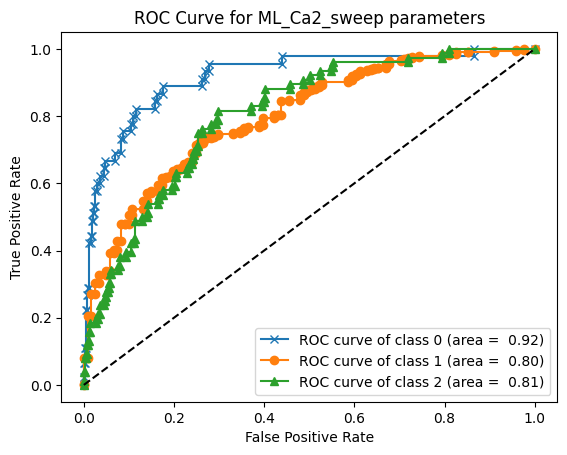

In [ ]:
Three_class = {'ML_Ca2_sweep': ML_Ca2_sweep_data,}
markers = ['x', 'o', '^', 'v']
fpr_dict = {}
tpr_dict = {}
roc_auc_dict = {}
for name, array in Three_class.items():
  X = array[:-1, :].T
  y = array[-1, :].flatten()
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, stratify = y, random_state = 42)
  model = LogisticRegression(multi_class = 'multinomial', solver = 'lbfgs', max_iter = 1000)
  model.fit(X_train, y_train)
  y_pred = model.predict(X_test)
  pred_difference = y_pred - y_test
  coef = model.coef_
  CCR = np.count_nonzero(pred_difference == 0)/len(pred_difference)
  print('CCR=', CCR)
  model_df = pd.DataFrame(np.transpose(coef))
  model_df.to_csv(f'{name}.csv', index = False)
  plt.figure()
  y_test_binarized = label_binarize(y_test, classes = [0, 1, 2])
  y_pred_proba = model.predict_proba(X_test)
  fpr_dict[name] = {}
  tpr_dict[name] = {}
  roc_auc_dict[name] = {}
  n_classes = y_test_binarized.shape[1]
  auc_data=[]

  for i in range(n_classes):
      # Get fpr, tpr, and auc values
      fpr_dict[name][i], tpr_dict[name][i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
      roc_auc_dict[name][i] = auc(fpr_dict[name][i], tpr_dict[name][i])

      # Append each fpr, tpr, and roc_auc to the auc_data list
      for fpr, tpr in zip(fpr_dict[name][i], tpr_dict[name][i]):
          auc_data.append([fpr, tpr, roc_auc_dict[name][i]])
  for i in range(n_classes):
    plt.plot(fpr_dict[name][i], tpr_dict[name][i], marker = markers[i], label = (f'ROC curve of class {i} (area = {roc_auc_dict[name][i]: .2f})'))
  plt.plot([0,1], [0,1], 'k--')
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title(f'ROC Curve for {name} parameters')
  plt.legend(loc = 'lower right')
  plt.savefig(f'{name}_ROC_curve.jpg', format='jpg', dpi=300)
  plt.show()

  auc_df = pd.DataFrame(auc_data, columns=['fpr', 'tpr', 'roc_auc'])
  auc_df.to_csv(f'{name}_auc_data.csv', index = False)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


CCR= 0.728


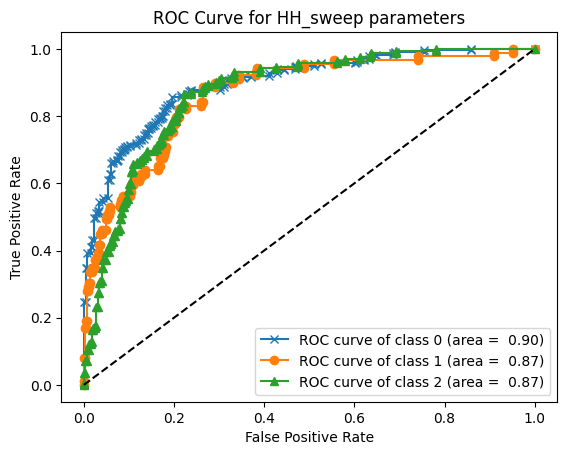

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


CCR= 0.744


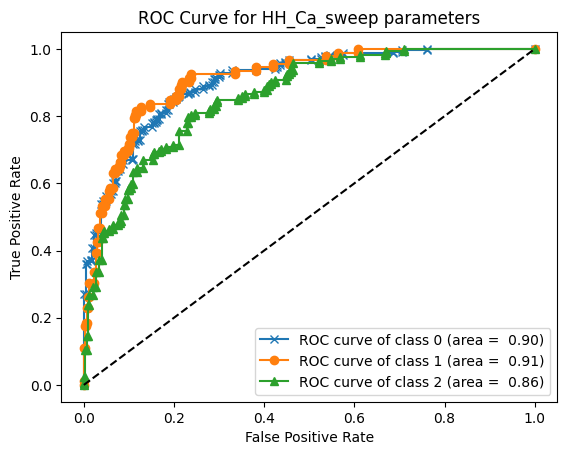

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


CCR= 0.806


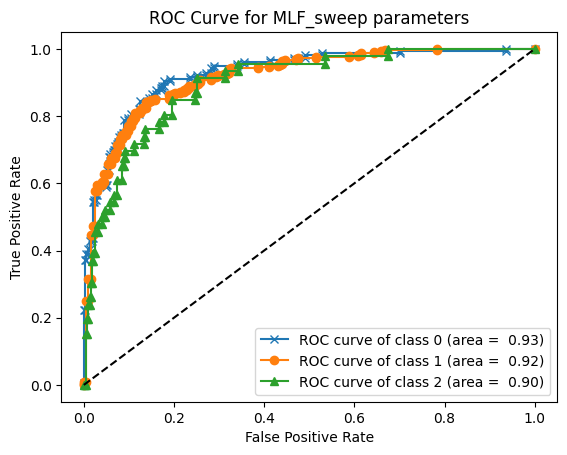

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


CCR= 0.898


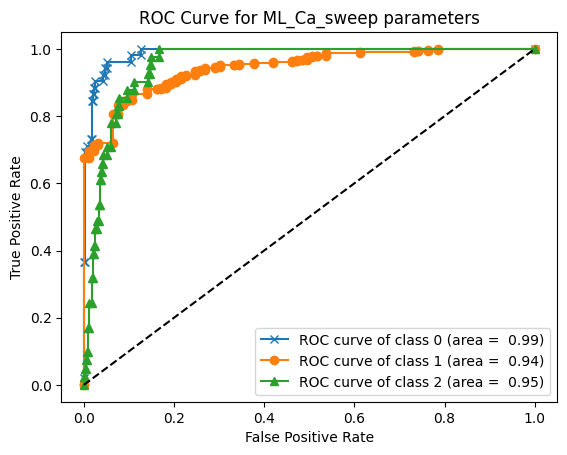

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


CCR= 0.79


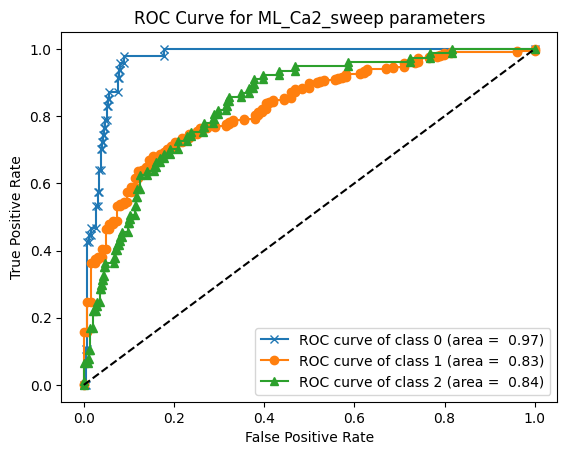

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


CCR= 0.826


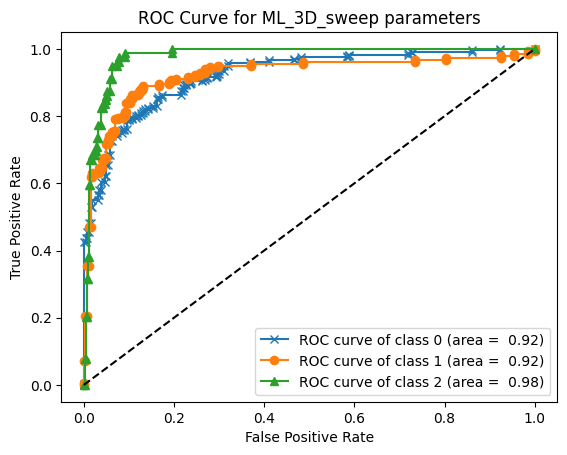

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
Three_class = {'HH_sweep': HH_sweep_data, 'HH_Ca_sweep': HH_Ca_sweep_data, 'MLF_sweep': MLF_sweep_data, 'ML_Ca_sweep': ML_Ca_sweep_data, 'ML_Ca2_sweep': ML_Ca2_sweep_data, 'ML_3D_sweep': ML_3D_sweep_data,}
markers = ['x', 'o', '^', 'v']
fpr_dict = {}
tpr_dict = {}
roc_auc_dict = {}
for name, array in Three_class.items():
  X = array[:-1, :].T
  y = array[-1, :].flatten()
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, stratify = y, random_state = 42)
  model = LogisticRegression(multi_class = 'multinomial', solver = 'lbfgs', max_iter = 1000)
  model.fit(X_train, y_train)
  y_pred = model.predict(X_test)
  pred_difference = y_pred - y_test
  coef = model.coef_
  CCR = np.count_nonzero(pred_difference == 0)/len(pred_difference)
  print('CCR=', CCR)
  model_df = pd.DataFrame(np.transpose(coef))
  model_df.to_csv(f'{name}.csv', index = False)
  plt.figure()
  y_test_binarized = label_binarize(y_test, classes = [0, 1, 2])
  y_pred_proba = model.predict_proba(X_test)
  fpr_dict[name] = {}
  tpr_dict[name] = {}
  roc_auc_dict[name] = {}
  n_classes = y_test_binarized.shape[1]
  auc_data=[]

  for i in range(n_classes):
      # Get fpr, tpr, and auc values
      fpr_dict[name][i], tpr_dict[name][i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
      roc_auc_dict[name][i] = auc(fpr_dict[name][i], tpr_dict[name][i])

      # Append each fpr, tpr, and roc_auc to the auc_data list
      for fpr, tpr in zip(fpr_dict[name][i], tpr_dict[name][i]):
          auc_data.append([fpr, tpr, roc_auc_dict[name][i]])
  for i in range(n_classes):
    plt.plot(fpr_dict[name][i], tpr_dict[name][i], marker = markers[i], label = (f'ROC curve of class {i} (area = {roc_auc_dict[name][i]: .2f})'))
  plt.plot([0,1], [0,1], 'k--')
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title(f'ROC Curve for {name} parameters')
  plt.legend(loc = 'lower right')
  plt.savefig(f'{name}_ROC_curve.jpg', format='jpg', dpi=300)
  plt.show()

  auc_df = pd.DataFrame(auc_data, columns=['fpr', 'tpr', 'roc_auc'])
  auc_df.to_csv(f'{name}_auc_data.csv', index = False)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


CCR= 0.75


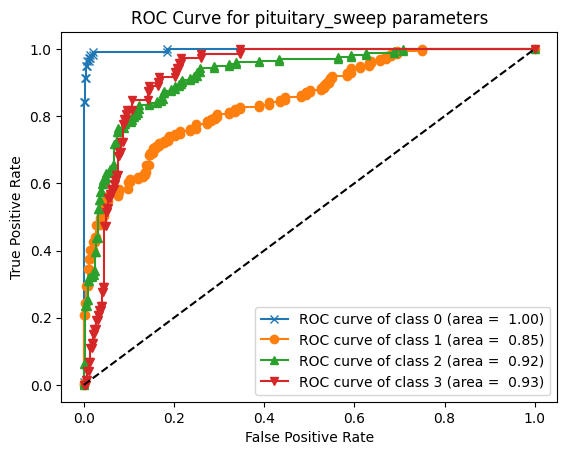

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
Four_classes = {'pituitary_sweep': pituitary_sweep_data,}
markers = ['x', 'o', '^', 'v']
fpr_dict = {}
tpr_dict = {}
roc_auc_dict = {}
for name, array in Four_classes.items():
  X = array[:-1, :].T
  y = array[-1, :].flatten()
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, stratify = y, random_state = 42)
  model = LogisticRegression(multi_class = 'multinomial', solver = 'lbfgs', max_iter = 1000)
  model.fit(X_train, y_train)
  y_pred = model.predict(X_test)
  pred_difference = y_pred - y_test
  coef = model.coef_
  CCR = np.count_nonzero(pred_difference == 0)/len(pred_difference)
  print('CCR=', CCR)
  model_df = pd.DataFrame(np.transpose(coef))
  model_df.to_csv(f'{name}.csv', index = False)
  plt.figure()
  y_test_binarized = label_binarize(y_test, classes = [0, 1, 2, 3])
  y_pred_proba = model.predict_proba(X_test)
  fpr_dict[name] = {}
  tpr_dict[name] = {}
  roc_auc_dict[name] = {}
  rec_auc = dict
  n_classes = y_test_binarized.shape[1]
  auc_data=[]

  for i in range(n_classes):
      # Get fpr, tpr, and auc values
      fpr_dict[name][i], tpr_dict[name][i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
      roc_auc_dict[name][i] = auc(fpr_dict[name][i], tpr_dict[name][i])

      # Append each fpr, tpr, and roc_auc to the auc_data list
      for fpr, tpr in zip(fpr_dict[name][i], tpr_dict[name][i]):
          auc_data.append([fpr, tpr, roc_auc_dict[name][i]])
  for i in range(n_classes):
    plt.plot(fpr_dict[name][i], tpr_dict[name][i], marker = markers[i], label = (f'ROC curve of class {i} (area = {roc_auc_dict[name][i]: .2f})'))
  plt.plot([0,1], [0,1], 'k--')
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title(f'ROC Curve for {name} parameters')
  plt.legend(loc = 'lower right')
  plt.savefig(f'{name}_ROC_curve.jpg', format='jpg', dpi=300)
  plt.show()
  auc_df = pd.DataFrame(auc_data, columns=['fpr', 'tpr', 'roc_auc'])
  auc_df.to_csv(f'{name}_auc_data.csv', index = False)

In [ ]:
import numpy as np
import pandas as pd
Three_class_coef = {'HH': None, 'HH_Ca': None, 'ML_Ca': None, 'ML_Ca2': None, 'ML_3D': None,}
#Three_class_coef = { 'HH_Ca': None,}
for name, array in Three_class_coef.items():
  Three_class_coef[name] = np.array(pd.read_csv(f'{name}_sweep.csv'))
  print(np.shape(Three_class_coef[name]))

(26, 3)
(31, 3)
(17, 3)
(20, 3)
(18, 3)


In [ ]:
def process_for_graph(array):
  log_abs = np.log10(np.abs(array))
  result = np.where(array>0, log_abs + 8, log_abs + 4)
  return result
Single_graph = {key: process_for_graph(value) for key,value in Three_class_coef.items()}

In [ ]:
np.shape(Single_graph['ML_Ca2_sweep'])

(20, 3)

#Radial plot

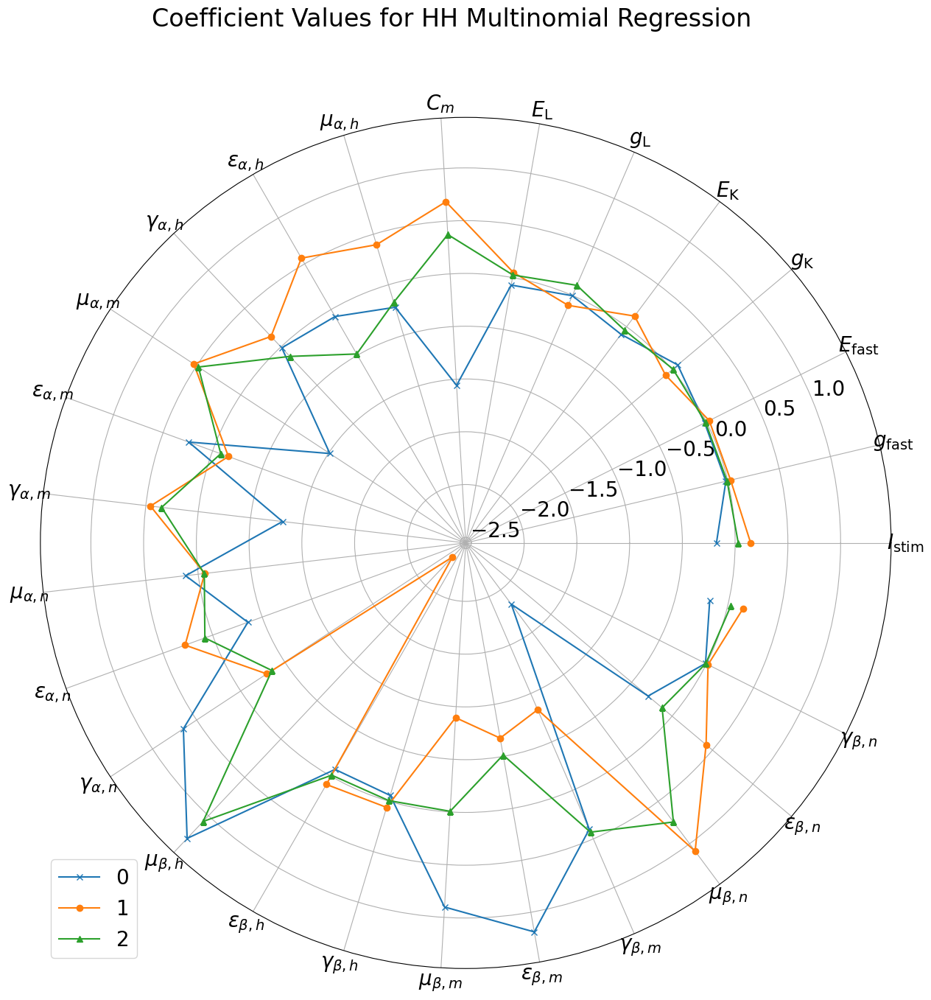

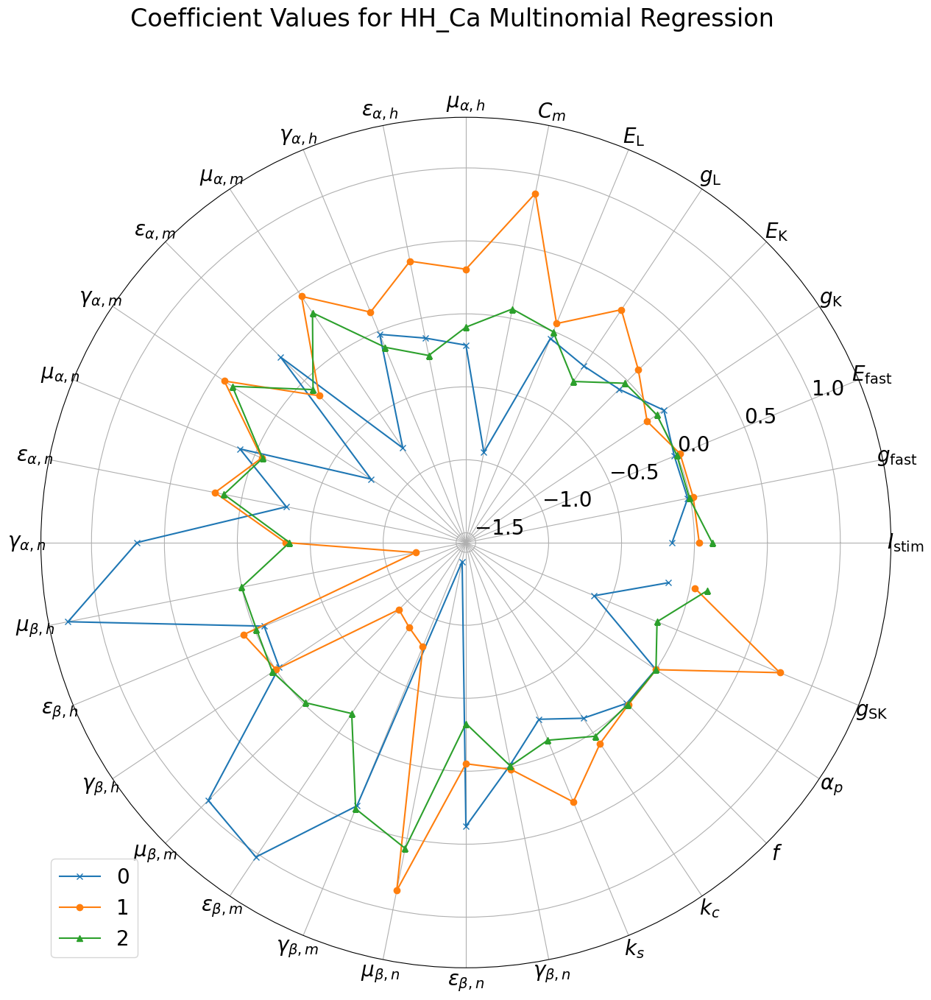

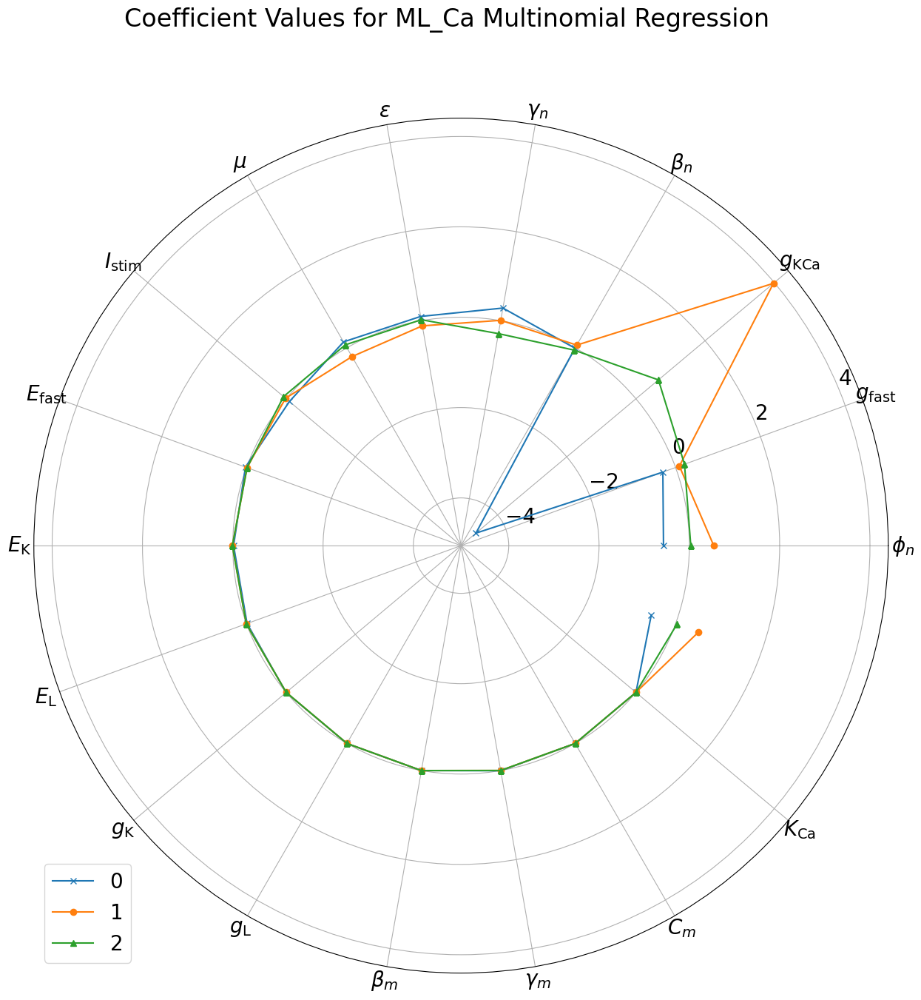

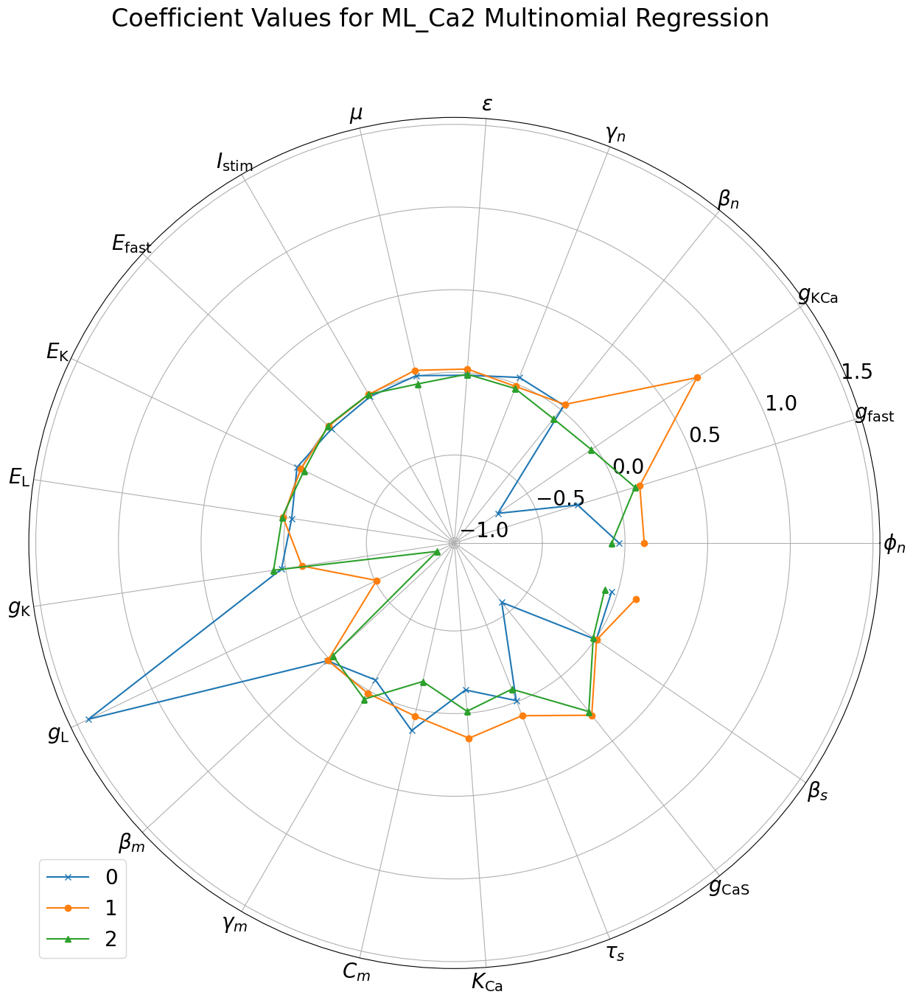

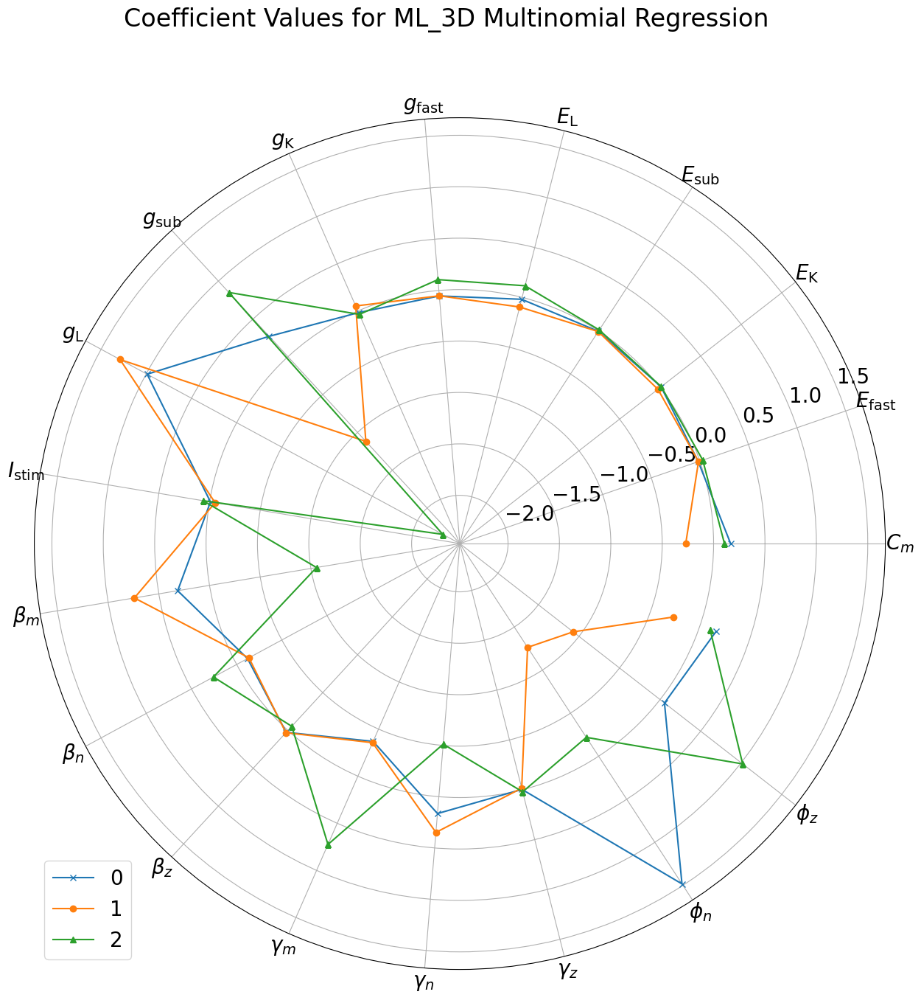

In [ ]:
import matplotlib.pyplot as plt
#HH_parameter_names = ["I_stim", "g_Na", "E_Na", "g_K", "E_K", "g_L", "E_L", "C_m",
 #   "mu_alpha_h", "epsilon_alpha_h", "gamma_alpha_h", "mu_alpha_m",
  #  "epsilon_alpha_m", "gamma_alpha_m", "mu_alpha_n", "epsilon_alpha_n",
   # "gamma_alpha_n", "mu_beta_h", "epsilon_beta_h", "gamma_beta_h",
    #"mu_beta_m", "epsilon_beta_m", "gamma_beta_m", "mu_beta_n",
    #"epsilon_beta_n", "gamma_beta_n"]
#HH_Ca_parameter_names = [
 #   "I_stim", "g_Ca", "E_Ca", "g_K", "E_K", "g_L", "E_L", "C_m",
  #  "mu_alpha_h", "epsilon_alpha_h", "gamma_alpha_h", "mu_alpha_m",
   # "epsilon_alpha_m", "gamma_alpha_m", "mu_alpha_n", "epsilon_alpha_n",
    #"gamma_alpha_n", "mu_beta_h", "epsilon_beta_h", "gamma_beta_h",
  #  "mu_beta_m", "epsilon_beta_m", "gamma_beta_m", "mu_beta_n",
   # "epsilon_beta_n", "gamma_beta_n", "k_s", "k_c", "f", "alpha_p", "g_SK"
#]
#MLF_parameter_names = ["V_0", "I_stim", "V_Ca", "epsilon", "V_K", "V_L", "g_K",
 #   "g_Ca", "g_L", "C_m", "beta_m", "gamma_m", "beta_y", "gamma_y", "phi"]
#ML_Ca_parameter_names = ["phi", "g_Ca", "g_KCa", "beta_n", "gamma_n", "epsilon",
 #   "mu", "I_stim", "E_Ca", "E_K", "E_L", "g_K", "g_L", "beta_m", "gamma_m", "C_m", "K_Ca"
#]
plt.rcParams.update({'font.size': 20})
parameter_names_dict = {
    "HH": HH_parameter_names,
    "HH_Ca": HH_Ca_parameter_names,
    "ML_Ca": ML_Ca_parameter_names,
    "ML_Ca2": ML_Ca2_parameter_names,
    "ML_3D": ML_3D_parameter_names,
    "pituitary" : pituitary_parameter_names
}
#ML_Ca2_parameter_names = ["phi", "g_Ca", "g_KCa", "beta_n", "gamma_n", "epsilon",
 #   "mu", "I_stim", "E_Ca", "E_K", "E_L", "g_K", "g_L", "beta_m", "gamma_m", "C_m", "K_Ca", "tau_s", "g_CaS", "beta_s"
#]
#ML_3D_parameter_names = ["C_m", "E_Na", "E_K", "E_sub", "E_L", "g_Na", "g_K_dr", "g_sub", "g_L", "I_stim", "beta_m", "beta_y", "beta_z", "gamma_m", "gamma_y",
 #   "gamma_z", "phi_y", "phi_z"]
parameter_names_dict = {
    "HH": HH_parameter_names,
    "HH_Ca": HH_Ca_parameter_names,
    "ML_Ca": ML_Ca_parameter_names,
    "ML_Ca2": ML_Ca2_parameter_names,
    "ML_3D": ML_3D_parameter_names
}
markers = ['x', 'o', '^', 'v']
for name, array in Three_class_coef.items():
  a = np.shape(array)[0]
  parameter_names = parameter_names_dict[name]
  angles = np.linspace(0, 2 * np.pi, a + 1, endpoint = False)
  angles += angles[:1]
  fig, ax = plt.subplots(figsize = (15, 15), subplot_kw={'projection': 'polar'})
  for i in range(3):
    data = np.concatenate((array[:, i], [array[0,i]]))
    ax.plot(angles, data, marker = markers[i], label = i)
  ax.set_xticks(angles[:-1])  # Omit the last angle to avoid duplicate labels
  ax.set_xticklabels(parameter_names)
  fig.suptitle(f'Coefficient Values for {name} Multinomial Regression')
  plt.legend(loc = 'lower left')
  plt.savefig(f'{name}_coef_weightings.jpg', format='jpg', dpi=300)
  plt.show()

In [ ]:
parameter_names

['$g_\\mathrm{fast}$',
 '$g_\\mathrm{KCa}$',
 '$I_\\mathrm{stim}$',
 '$\\epsilon$',
 '$\\mu$',
 '$\\beta_n$',
 '$\\gamma_n$',
 '$\\phi_n$']

In [ ]:
pituitary_labels = ["C_m", "g_Ca", "g_K", "g_SK", "g_BK", "g_leak",
    "tau_m", "tau_n", "tau_BK", "k_c"]
Four_class_coef = {'Pituitary' : None,}
for name, array in Four_class_coef.items():
  Four_class_coef[name] = np.array(pd.read_csv(f'{name}_sweep.csv'))
  print(np.shape(Four_class_coef[name]))

(10, 4)


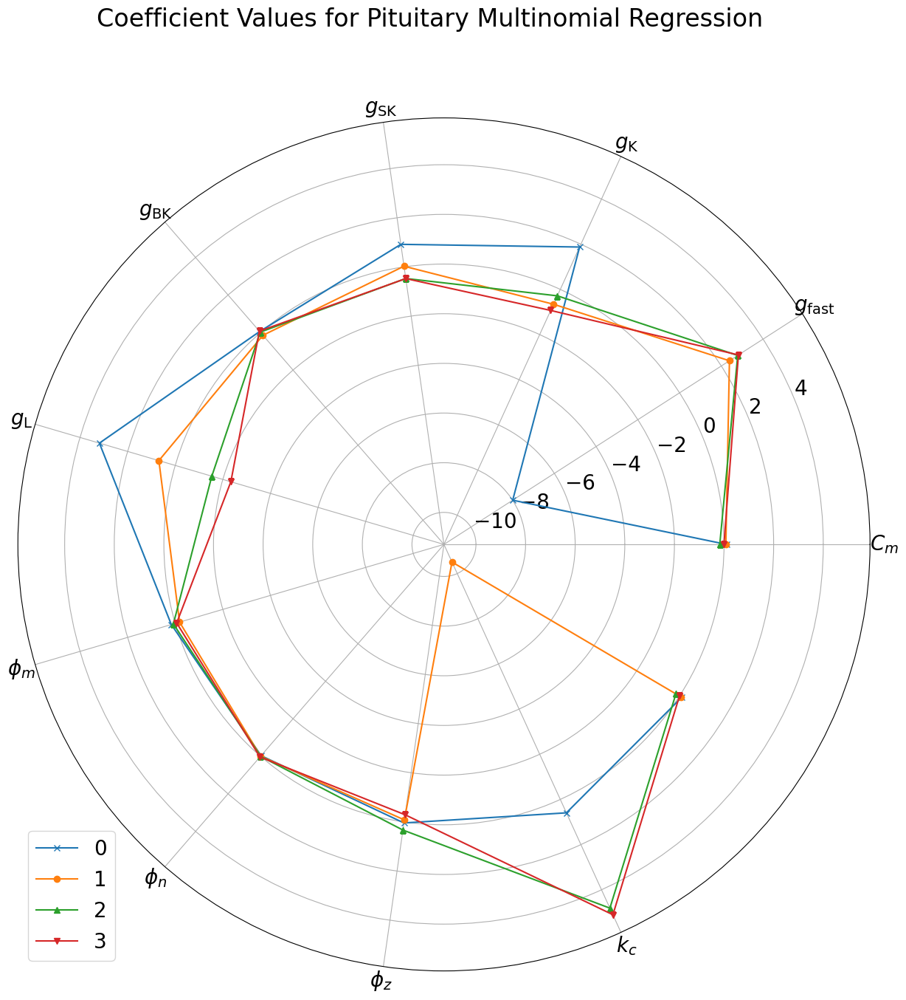

In [ ]:

parameter_names_dict = {'Pituitary' : pituitary_parameter_names}
for name, array in Four_class_coef.items():
  a = np.shape(array)[0]
  angles = np.linspace(0, 2 * np.pi, a + 1, endpoint = False)
  angles += angles[:1]
  fig, ax = plt.subplots(figsize = (15, 15), subplot_kw={'projection': 'polar'})
  for i in range(4):
    data = np.concatenate((array[:, i], [array[0,i]]))
    ax.plot(angles, data, marker = markers[i], label = i)
  ax.set_xticks(angles[:-1])  # Omit the last angle to avoid duplicate labels
  ax.set_xticklabels(pituitary_parameter_names)
  fig.suptitle(f'Coefficient Values for {name} Multinomial Regression')
  plt.legend(loc = 'lower left')
  plt.savefig(f'{name}_coef_weightings.jpg', format='jpg', dpi=300)
  plt.show()

### Normalised radial plot

In [ ]:
import numpy as np
import pandas as pd
Coef = {'HH': None, 'HH_Ca': None, 'MLF': None, 'ML_Ca': None, 'ML_Ca2': None, 'ML_3D': None, 'pituitary' : None}
for name, array in Coef.items():
  Coef[name] = np.array(pd.read_csv(f'{name}_sweep.csv'))
  print(np.shape(Coef[name]))

(26, 3)
(31, 3)
(15, 3)
(17, 3)
(20, 3)
(18, 3)
(10, 4)


In [ ]:
import numpy as np
import pandas as pd
pituitary_parameter_names = ["C_m", "g_Ca", "g_K", "g_SK", "g_BK", "g_leak",
    "tau_m", "tau_n", "tau_BK", "k_c"]
HH_parameter_names = ["I_stim", "g_Na", "E_Na", "g_K", "E_K", "g_L", "E_L", "C_m",
    "mu_alpha_h", "epsilon_alpha_h", "gamma_alpha_h", "mu_alpha_m",
    "epsilon_alpha_m", "gamma_alpha_m", "mu_alpha_n", "epsilon_alpha_n",
    "gamma_alpha_n", "mu_beta_h", "epsilon_beta_h", "gamma_beta_h",
    "mu_beta_m", "epsilon_beta_m", "gamma_beta_m", "mu_beta_n",
    "epsilon_beta_n", "gamma_beta_n"]
HH_Ca_parameter_names = [
    "I_stim", "g_Ca", "E_Ca", "g_K", "E_K", "g_L", "E_L", "C_m",
    "mu_alpha_h", "epsilon_alpha_h", "gamma_alpha_h", "mu_alpha_m",
    "epsilon_alpha_m", "gamma_alpha_m", "mu_alpha_n", "epsilon_alpha_n",
    "gamma_alpha_n", "mu_beta_h", "epsilon_beta_h", "gamma_beta_h",
    "mu_beta_m", "epsilon_beta_m", "gamma_beta_m", "mu_beta_n",
    "epsilon_beta_n", "gamma_beta_n", "k_s", "k_c", "f", "alpha_p", "g_SK"
]
MLF_parameter_names = ["V_0", "I_stim", "V_Ca", "epsilon", "V_K", "V_L", "g_K",
    "g_Ca", "g_L", "C_m", "beta_m", "gamma_m", "beta_y", "gamma_y", "phi"]

ML_Ca_parameter_names = ["phi", "g_Ca", "g_KCa", "beta_n", "gamma_n", "epsilon",
    "mu", "I_stim", "E_Ca", "E_K", "E_L", "g_K", "g_L", "beta_m", "gamma_m", "C_m", "K_Ca"
]
ML_Ca2_parameter_names = ["phi", "g_Ca", "g_KCa", "beta_n", "gamma_n", "epsilon",
    "mu", "I_stim", "E_Ca", "E_K", "E_L", "g_K", "g_L", "beta_m", "gamma_m", "C_m", "K_Ca", "tau_s", "g_CaS", "beta_s"
]
ML_3D_parameter_names = ["C_m", "E_Na", "E_K", "E_sub", "E_L", "g_Na", "g_K_dr", "g_sub", "g_L", "I_stim", "beta_m", "beta_y", "beta_z", "gamma_m", "gamma_y",
    "gamma_z", "phi_y", "phi_z"]
parameter_names_dict = {
    "HH": HH_parameter_names,
    "HH_Ca": HH_Ca_parameter_names,
    "MLF": MLF_parameter_names,
    "ML_Ca": ML_Ca_parameter_names,
    "ML_Ca2": ML_Ca2_parameter_names,
    "ML_3D": ML_3D_parameter_names,
    "pituitary" : pituitary_parameter_names
}
Coef_all = []
for name, array in Coef.items():
  model_data = []
  n = np.shape(array)[0]
  parameter_names = parameter_names_dict[name]
  model_data.append([name, np.nan, np.nan, np.nan])
  for i in range(n):
    model_data.append([parameter_names[i], array[i, :]])
  Coef_all.append(model_data)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
Coef_All = pd.read_csv('Coef_All.csv', na_values='np.nan', header = None).to_numpy()
models = ['HH', 'HH_Ca', 'ML_3D', 'ML_Ca', 'ML_Ca2', 'Pituitary']
#all_parameter_names = ['g_fast', 'E_fast', 'g_K', 'E_K', 'g_L', 'E_L', 'g_sub', 'E_sub', 'g_SK', 'g_KCa', 'g_CaS', 'g_BK', 'I_stim', 'V_epsilon', 'V_0', 'C_m',
#                       'epsilon', 'mu', 'K_Ca', 'k_s', 'k_c', 'f', 'alpha_p', 'beta_m', 'gamma_m', 'phi_m', 'beta_n', 'gamma_n', 'phi_n', 'beta_z', 'gamma_z',
 #                      'phi_z', 'beta_s', 'tau_s', 'mu_alpha_h', 'epsilon_alpha_h', 'gamma_alpha_h', 'mu_alpha_m', 'epsilon_alpha_m', 'gamma_alpha)m',
  #                     'mu_alpha_n', 'epsilon_alpha_n', 'gamma_alpha_n', 'mu_beta_h', 'epsilon_beta_h', 'gamma_beta_h', 'mu_beta_m', 'epsilon_beta_m', 'gamma_beta_m',
   #                    'mu_beta_n', 'epsilon_beta_n', 'gamma_beta_n']
Markers = ['o', 'v', 's', 'D', 'P', '*', '+']
Classifications = ['Non-Excitable', 'Excitable', 'Spiking']
angles = np.linspace(0, 2 * np.pi, 52)

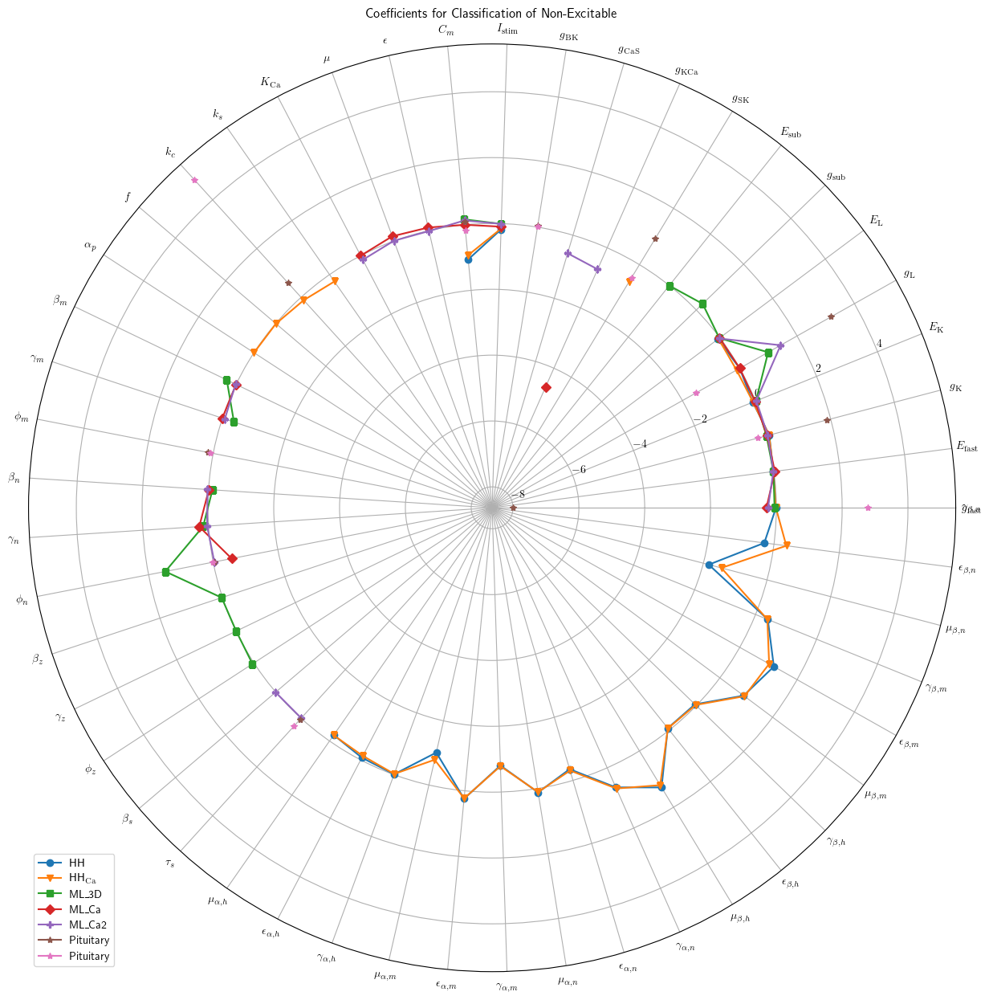

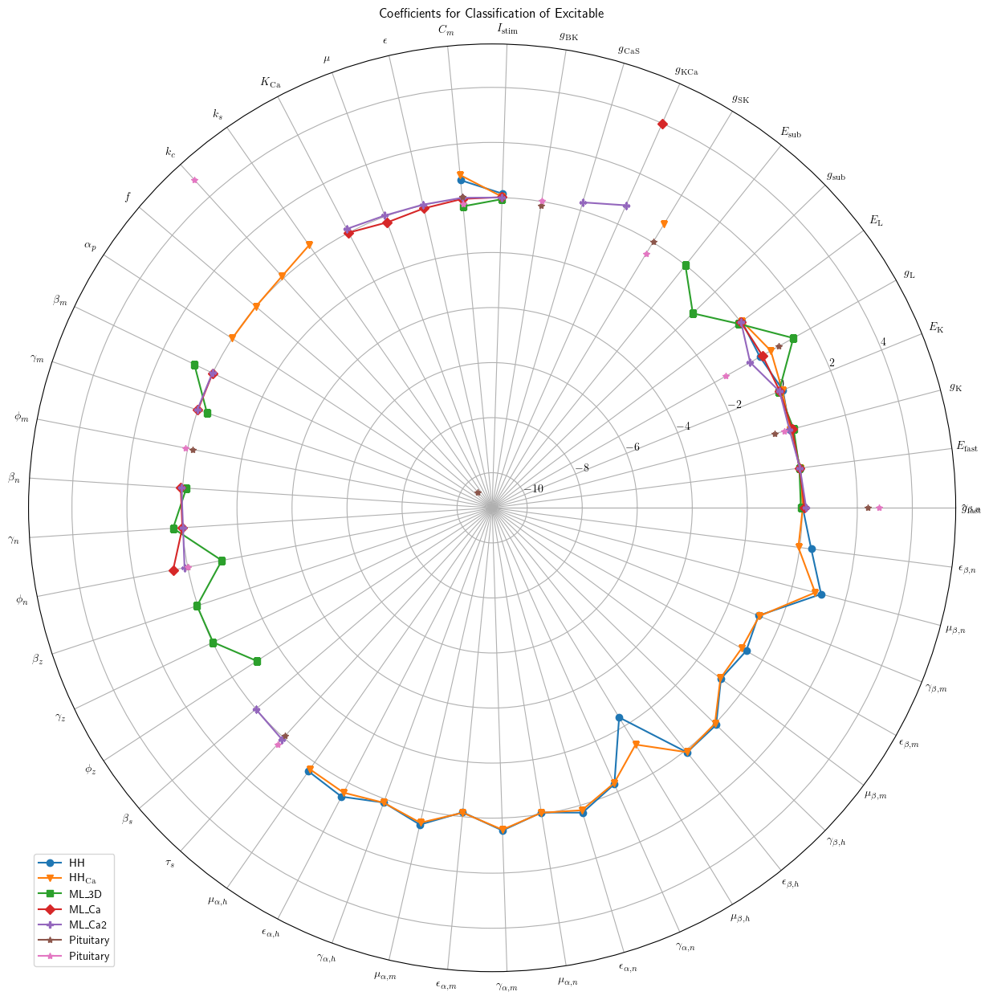

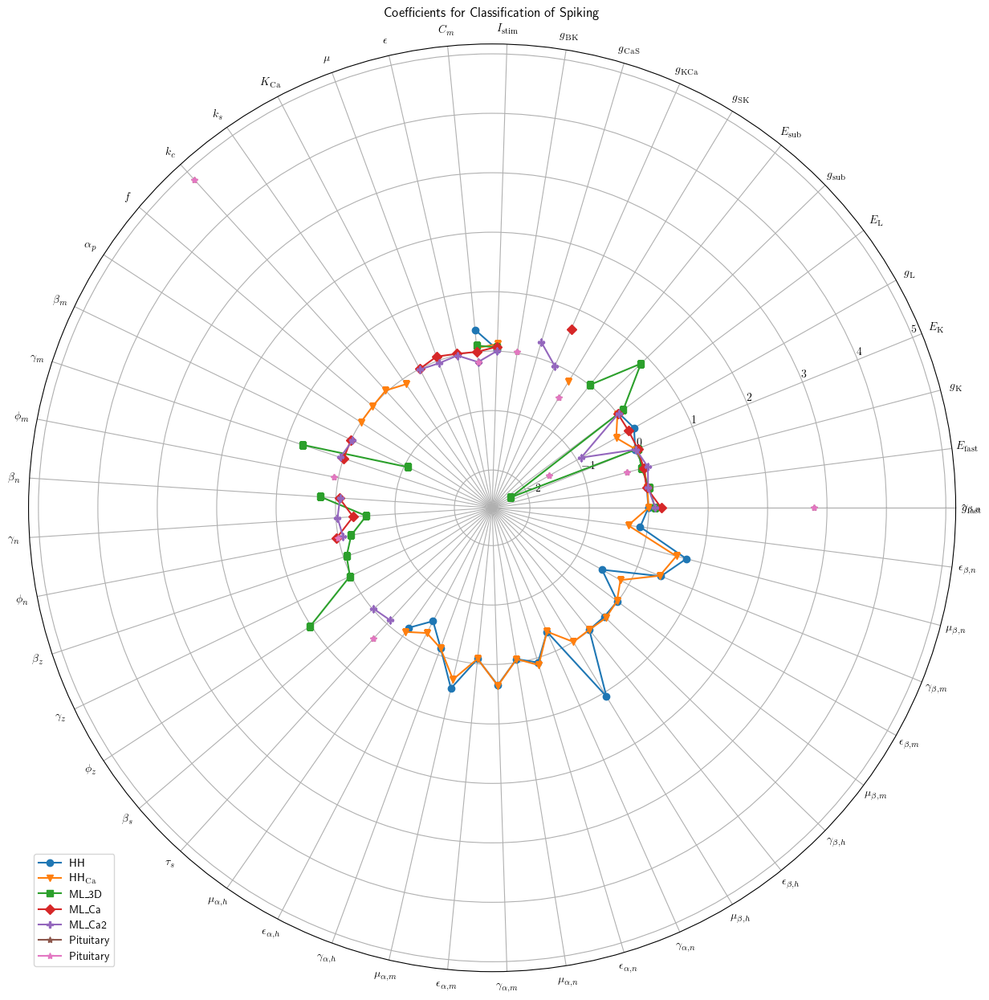

In [ ]:
#graphs for comparison
for j in range(3):

  fig, ax = plt.subplots(figsize = (15, 15), subplot_kw={'projection': 'polar'})
  for i in range(6):
    ax.plot(angles, Coef_All[:, 3 * i + j], label = models[i], marker = Markers[i])
  ax.set_xticks(angles[:])  # Omit the last angle to avoid duplicate labels
  ax.set_xticklabels(all_parameter_names)
  ax.plot(angles, Coef_All[:, 3 * i + 2], label = models[i], marker = Markers[i])
  ax.set_title(f'Coefficients for Classification of {Classifications[j]}')
  plt.legend(loc = 'lower left')
  plt.savefig(f'Coef_{Classifications[j]}.jpg', format='jpg', dpi=300)
  plt.show()

In [ ]:
HH_parameter_names = all_parameter_names[0:6]+[all_parameter_names[12]]+ [all_parameter_names[13]]+ all_parameter_names[32:49]
HH_Ca_parameter_names = all_parameter_names[0:6] + [all_parameter_names[8]] + all_parameter_names[12:14] + all_parameter_names[17:21] + all_parameter_names[32:50]
HH_indices = [12, 0, 1, 2, 3, 4, 5, 13]
HH_parameter_names = [all_parameter_names[i] for i in HH_indices] + all_parameter_names[32:50]
HH_Ca_parameter_names = [all_parameter_names[i] for i in HH_indices] + all_parameter_names[32:50] + all_parameter_names[17:21] + [all_parameter_names[8]]


ML_Ca_indices = [26, 0, 9, 24, 25, 14, 15, 12, 1, 3, 5, 2, 4, 21, 22, 13, 16]

ML_Ca_parameter_names = [all_parameter_names[i] for i in ML_Ca_indices]
ML_Ca2_indices = [26, 0, 9, 24, 25, 14, 15, 12, 1, 3, 5, 2, 4, 21, 22, 13, 16, 31, 10, 30]
ML_Ca2_parameter_names = [all_parameter_names[i] for i in ML_Ca2_indices]
pituitary_indices = [13, 0, 2, 8, 11, 4, 23, 26, 29, 18]
pituitary_parameter_names = [all_parameter_names[i] for i in pituitary_indices]

ML_3D_indices = [13, 1, 3, 7, 5, 0, 2, 6, 4, 12, 21, 24, 27, 22, 25, 28, 26, 29]
ML_3D_parameter_names = [all_parameter_names[i] for i in ML_3D_indices]
HH_parameter_names


['$I_\\mathrm{stim}$',
 '$g_\\mathrm{fast}$',
 '$E_\\mathrm{fast}$',
 '$g_\\mathrm{K}$',
 '$E_\\mathrm{K}$',
 '$g_\\mathrm{L}$',
 '$E_\\mathrm{L}$',
 '$C_m$',
 '$\\mu_{\\alpha,h}$',
 '$\\epsilon_{\\alpha,h}$',
 '$\\gamma_{\\alpha,h}$',
 '$\\mu_{\\alpha,m}$',
 '$\\epsilon_{\\alpha,m}$',
 '$\\gamma_{\\alpha,m}$',
 '$\\mu_{\\alpha,n}$',
 '$\\epsilon_{\\alpha,n}$',
 '$\\gamma_{\\alpha,n}$',
 '$\\mu_{\\beta,h}$',
 '$\\epsilon_{\\beta,h}$',
 '$\\gamma_{\\beta,h}$',
 '$\\mu_{\\beta,m}$',
 '$\\epsilon_{\\beta,m}$',
 '$\\gamma_{\\beta,m}$',
 '$\\mu_{\\beta,n}$',
 '$\\epsilon_{\\beta,n}$',
 '$\\gamma_{\\beta,n}$']

In [ ]:


ML_3D_parameter_names = ["C_m", "E_Na", "E_K", "E_sub", "E_L", "g_Na", "g_K_dr", "g_sub", "g_L", "I_stim", "beta_m", "beta_y", "beta_z", "gamma_m", "gamma_y",
    "gamma_z", "phi_y", "phi_z"]

ValueError: x and y must have same first dimension, but have shapes (52,) and (1,)

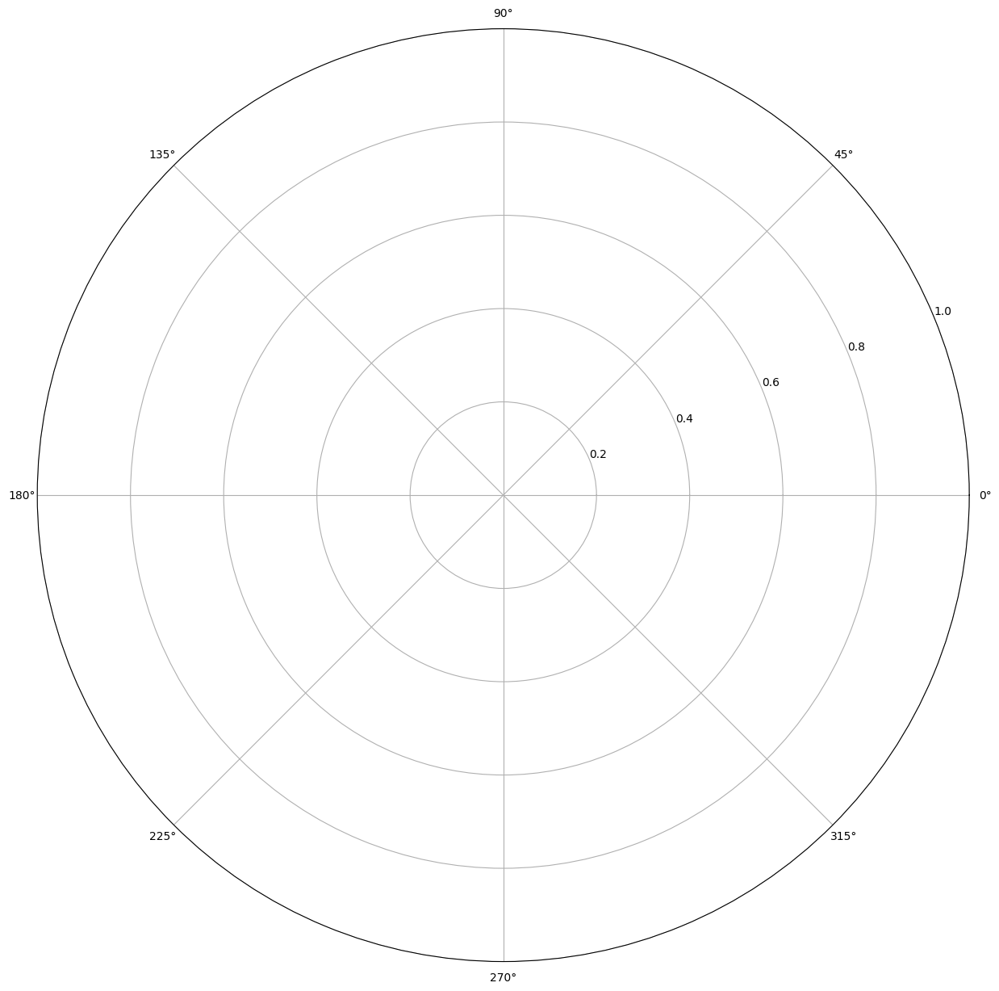

In [ ]:
for i in range(6):
  fig, ax = plt.subplots(figsize = (15, 15), subplot_kw={'projection': 'polar'})
  if i == 5:
    for j in range(4):
      for m in range(52):
        single_coef = []
        excluded_parameters = []
        if np.isnan(Coef_All[m, 3 * i + j]):
          excluded_parameters.append(i)
        else:
          single_coef.append(Coef_All[m, 3 * i + j])
        single_angles = np.linspace(0, 2 * np.pi, 52 - len(excluded_parameters))
        ax.plot(single_angles, single_coef, label = Classifications[j])
      single_parameter_names = [item for idx, item in enumerate(all_parameter_names) if idx not in excluded_parameters]
      ax.set_title(f'Coefficients for {models[i]} Model')
      plt.legend(loc ='lower left')
      ax.set_xticks(single_angles[:])  # Omit the last angle to avoid duplicate labels
      ax.set_xticklabels(single_parameter_names)
      plt.savefig(f'Coef_{models[i]}')
      plt.show()
  else:
    for j in range(3):
      for m in range(52):
        single_coef = []
        excluded_parameters = []
        if Coef_All[m, 3 * i + j] == np.nan:
          excluded_parameters.append(i)
        else:
          single_coef.append(Coef_All[m, 3 * i + j])
        single_angles = np.linspace(0, 2 * np.pi, 52 - len(excluded_parameters))
        ax.plot(single_angles, single_coef, label = Classifications[j])
      single_parameter_names = [item for idx, item in enumerate(all_parameter_names) if idx not in excluded_parameters]
      ax.set_title(f'Coefficients for {models[i]} Model')
      plt.legend(loc ='lower left')
      ax.set_xticks(single_angles[:])  # Omit the last angle to avoid duplicate labels
      ax.set_xticklabels(single_parameter_names)
      plt.savefig(f'Coef_{models[i]}')
      plt.show()


In [ ]:
i = 0
j = 0


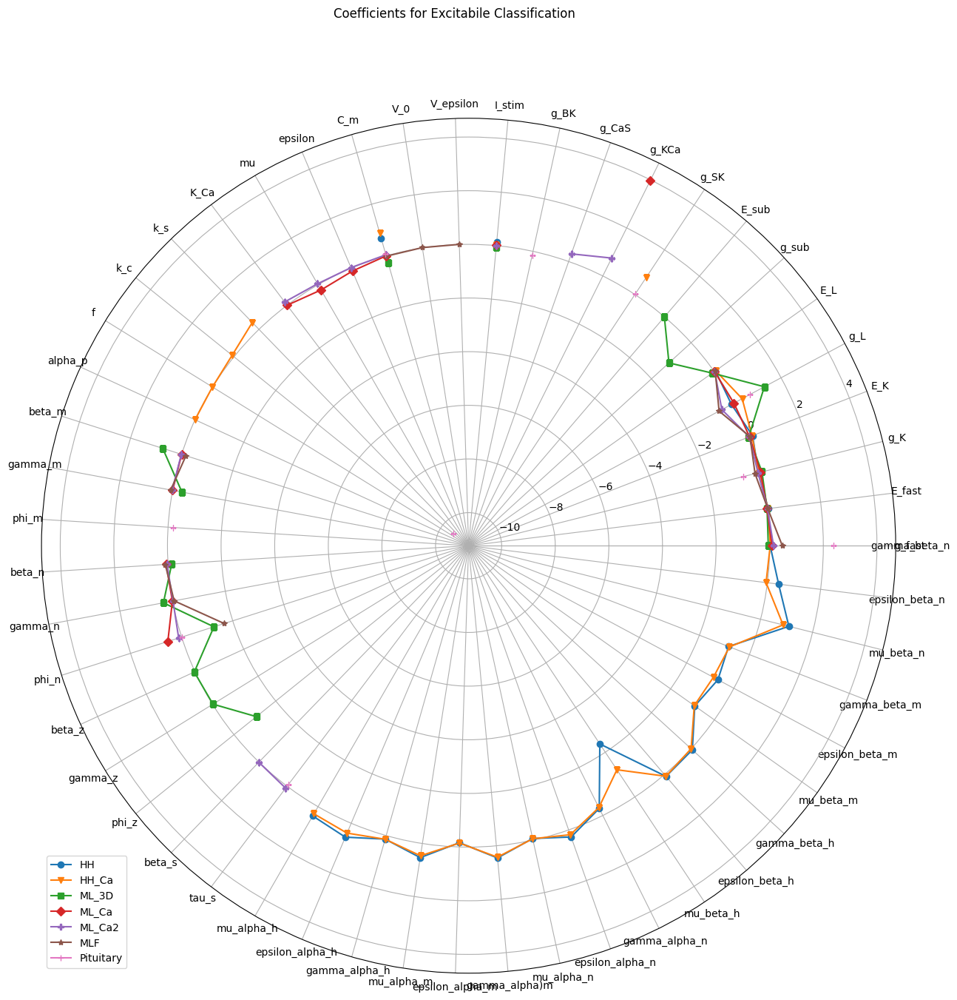

In [ ]:
fig, ax = plt.subplots(figsize = (15, 15), subplot_kw={'projection': 'polar'})
for i in range(7):
  ax.plot(angles, Coef_All[:, 3 * i + 1], label = models[i], marker = Markers[i])
ax.set_xticks(angles[:])  # Omit the last angle to avoid duplicate labels
ax.set_xticklabels(all_parameter_names)
plt.suptitle('Coefficients for Excitabile Classification')
plt.legend(loc = 'lower left')
plt.savefig('Coef_excitable.jpg', format='jpg', dpi=300)
plt.show()

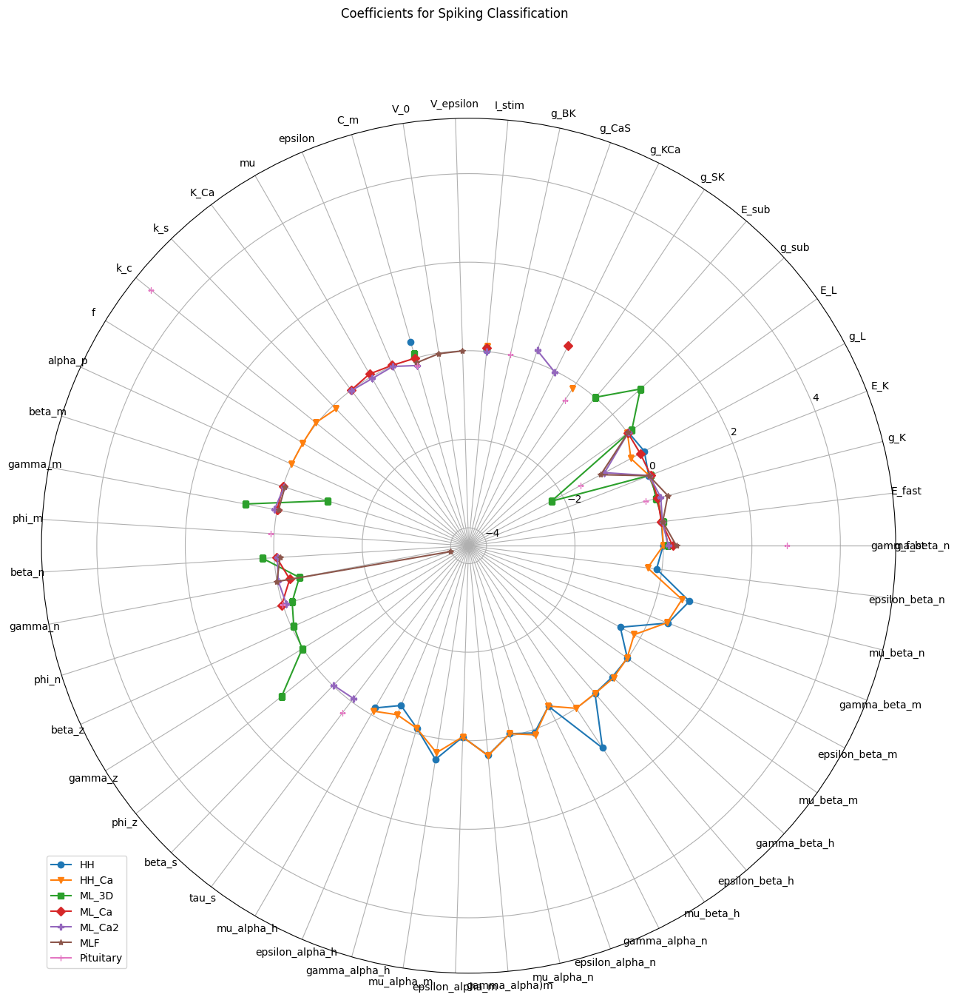

In [ ]:

fig, ax = plt.subplots(figsize = (15, 15), subplot_kw={'projection': 'polar'})
for i in range(7):
  ax.plot(angles, Coef_All[:, 3 * i + 2], label = models[i], marker = Markers[i])
ax.set_xticks(angles[:])  # Omit the last angle to avoid duplicate labels
ax.set_xticklabels(all_parameter_names)
plt.suptitle('Coefficients for Spiking Classification')
plt.legend(loc = 'lower left')
plt.savefig('Coef_spiking.jpg', format='jpg', dpi=300)
plt.show()

In [ ]:
Coef_All = pd.read_csv('Coef_All.csv', na_values='np.nan', header = None).to_numpy()

In [ ]:
import numpy as np
names = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h']
numbers = np.array([np.nan, np.nan, 1, 2, np.nan, 3, np.nan, 4])
delete = []
number = []
for i in range(8):
  if np.isnan(numbers[i]):
    delete.append(i)
  else:
    number.append(numbers[i])

In [ ]:
single_parameter_names = [item for idx, item in enumerate(names) if idx not in delete]
single_parameter_names

['c', 'd', 'f', 'h']

### LateX in Matplotlib.pyplot

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
plt.rcParams['text.usetex'] = True

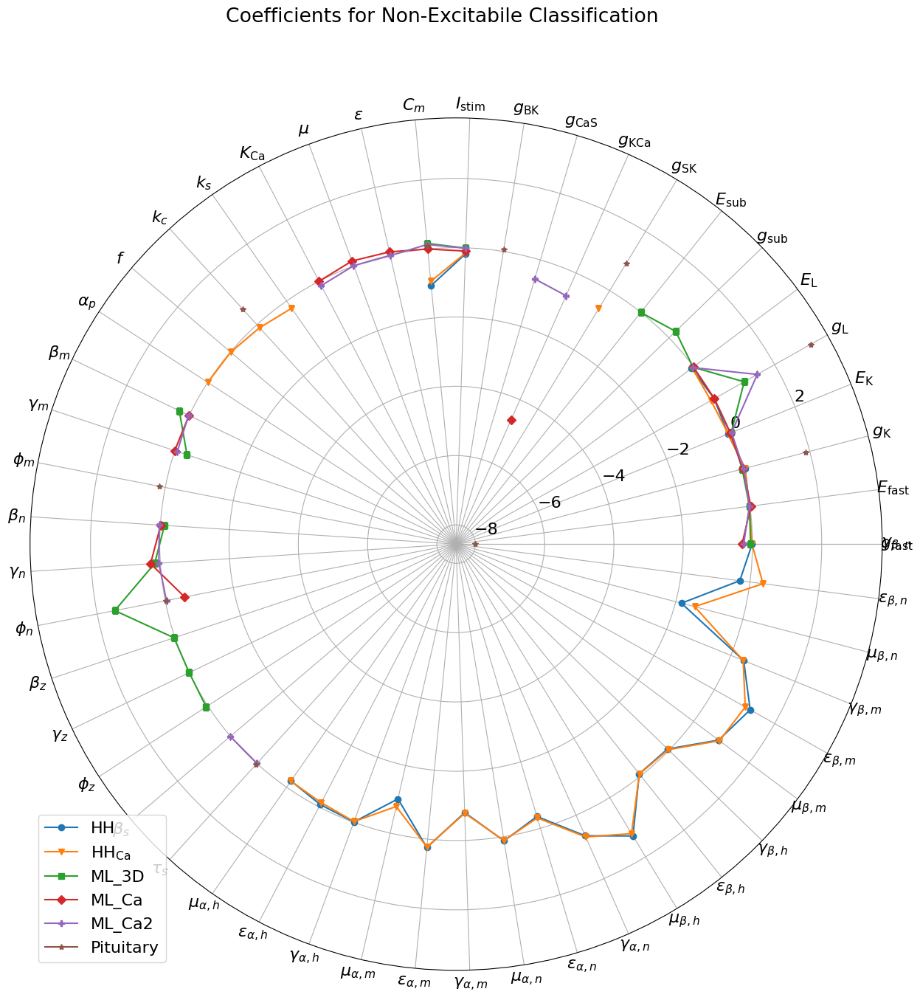

In [ ]:

models = ['HH', 'HH$_\mathrm{Ca}$', 'ML_3D', 'ML_Ca', 'ML_Ca2', 'Pituitary']
all_parameter_names = ['$g_\mathrm{fast}$', '$E_\mathrm{fast}$', '$g_\mathrm{K}$', '$E_\mathrm{K}$', '$g_\mathrm{L}$',
                       '$E_\mathrm{L}$', '$g_\mathrm{sub}$', '$E_\mathrm{sub}$', '$g_\mathrm{SK}$', '$g_\mathrm{KCa}$',
                       '$g_\mathrm{CaS}$', '$g_\mathrm{BK}$', '$I_\mathrm{stim}$', '$C_m$',
                       '$\epsilon$', '$\mu$', '$K_\mathrm{Ca}$', '$k_s$', '$k_c$', '$f$', '$\\alpha_p$', '$\\beta_m$',
                       '$\gamma_m$', '$\phi_m$', '$\\beta_n$', '$\gamma_n$', '$\phi_n$', '$\\beta_z$', '$\gamma_z$',
                       '$\phi_z$', '$\\beta_s$', '$\\tau_s$', '$\\mu_{\\alpha,h}$', '$\\epsilon_{\\alpha,h}$', '$\\gamma_{\\alpha,h}$',
                       '$\\mu_{\\alpha,m}$', '$\\epsilon_{\\alpha,m}$', '$\\gamma_{\\alpha,m}$',
                       '$\\mu_{\\alpha,n}$', '$\\epsilon_{\\alpha,n}$', '$\\gamma_{\\alpha,n}$', '$\\mu_{\\beta,h}$', '$\\epsilon_{\\beta,h}$',
                       '$\\gamma_{\\beta,h}$', '$\\mu_{\\beta,m}$', '$\\epsilon_{\\beta,m}$', '$\\gamma_{\\beta,m}$',
                       '$\\mu_{\\beta,n}$', '$\\epsilon_{\\beta,n}$', '$\\gamma_{\\beta,n}$']
Markers = ['o', 'v', 's', 'D', 'P', '*', '+']

fig, ax = plt.subplots(figsize = (15, 15), subplot_kw={'projection': 'polar'})
angles = np.linspace(0, 2 * np.pi, 50)
for i in range(6):
  ax.plot(angles, Coef_All[:, 3 * i], label = models[i], marker = Markers[i])
ax.set_xticks(angles[:])  # Omit the last angle to avoid duplicate labels
ax.set_xticklabels(all_parameter_names)
plt.suptitle('Coefficients for Non-Excitabile Classification')
"""  ax2.plot(angles, Coef_All[:, 3 * i + 1], label = models[i], marker = Markers[i])
  ax2.set_title('Coefficients for Excitable Classification')

  ax3.plot(angles, Coef_All[:, 3 * i + 2], label = models[i], marker = Markers[i])
  ax3.set_title('Coefficients for Spiking Classification')"""

plt.legend(loc = 'lower left')
#plt.savefig('Coef_nonexcitable.jpg', format='jpg', dpi=300)
plt.show()

In [ ]:
!sudo apt-get install texlive-latex-extra -y
!sudo apt-get install dvipng -y
!sudo apt-get install texlive-fonts-recommended texlive-fonts-extra texlive-latex-extra -y
!sudo apt-get install texlive-latex-base


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  dvisvgm fonts-droid-fallback fonts-lato fonts-lmodern fonts-noto-mono
  fonts-texgyre fonts-urw-base35 libapache-pom-java libcommons-logging-java
  libcommons-parent-java libfontbox-java libfontenc1 libgs9 libgs9-common
  libidn12 libijs-0.35 libjbig2dec0 libkpathsea6 libpdfbox-java libptexenc1
  libruby3.0 libsynctex2 libteckit0 libtexlua53 libtexluajit2 libwoff1
  libzzip-0-13 lmodern poppler-data preview-latex-style rake ruby
  ruby-net-telnet ruby-rubygems ruby-webrick ruby-xmlrpc ruby3.0
  rubygems-integration t1utils tex-common tex-gyre texlive-base
  texlive-binaries texlive-fonts-recommended texlive-latex-base
  texlive-latex-recommended texlive-pictures texlive-plain-generic tipa
  xfonts-encodings xfonts-utils
Suggested packages:
  fonts-noto fonts-freefont-otf | fonts-freefont-ttf libavalon-framework-java
  libcommons-logging

In [ ]:
!sudo apt install cm-super dvipng texlive-latex-extra texlive-latex-recommended
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
dvipng is already the newest version (1.15-1.1).
texlive-latex-extra is already the newest version (2021.20220204-1).
texlive-latex-recommended is already the newest version (2021.20220204-1).
texlive-latex-recommended set to manually installed.
The following additional packages will be installed:
  cm-super-minimal pfb2t1c2pfb
The following NEW packages will be installed:
  cm-super cm-super-minimal pfb2t1c2pfb
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 26.0 MB of archives.
After this operation, 59.9 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 cm-super-minimal all 0.3.4-17 [5,777 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 pfb2t1c2pfb amd64 0.3-11 [9,342 B]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 cm-super all 0.3.4-17 [20.2 MB]
Fetched 26.0 MB in 1s (19.4 MB/s)

Text(0.5, 1.0, '\\TeX\\ is Number $\\displaystyle\\sum_{n=1}^\\infty\\frac{-e^{i\\pi}}{2^n}$!')

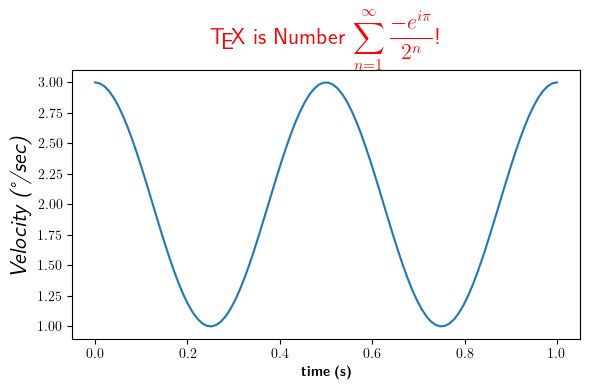

In [ ]:
t = np.linspace(0.0, 1.0, 100)
s = np.cos(4 * np.pi * t) + 2

fig, ax = plt.subplots(figsize=(6, 4), tight_layout=True)
ax.plot(t, s)

ax.set_xlabel(r'\textbf{time (s)}')
ax.set_ylabel('\\textit{Velocity (\N{DEGREE SIGN}/sec)}', fontsize=16)
ax.set_title(r'\TeX\ is Number $\displaystyle\sum_{n=1}^\infty'
             r'\frac{-e^{i\pi}}{2^n}$!', fontsize=16, color='r')